In [3]:
import pandas as pd
import requests
from io import StringIO

%matplotlib inline

import numpy as np
#import modin.pandas as pd
import matplotlib.pyplot as plt

#import cufflinks as cf
#cf.go_offline()
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import svm
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

%matplotlib inline
import numpy as np
import seaborn as sns; sns.set()

#from pathos.multiprocessing import ProcessingPool as Pool
import pandas.util.testing as tm
import multiprocessing as mp

<ipython-input-3-2d3d368fb622>:27: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [5]:
#pip install sklearn

In [2]:
female_drive = 'https://drive.google.com/file/d/17fVhjvXH-ckfQM1kY_4CrQH2UDlszY-L/view?usp=sharing'

file_id = female_drive.split('/')[-2]
dwn_url='https://drive.google.com/uc?export=download&id=' + file_id
url = requests.get(dwn_url).text
csv_raw = StringIO(url)
female_clean = pd.read_csv(csv_raw)
female_clean.head()
female_clean = female_clean.iloc[0:22990]
female_clean.tail()

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (9,11) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Unnamed: 0,FID,Id,Bear_ID,SAMPLEID,TURNANGLE,STEPLENGTH,BEARING,OBSERVED,datetime,month,CLUSTER,disagLWM,disagMIN,disagMAX,disagBEG,disagEND,disforLWM,disforMIN,disforMAX,disforBEG,disforEND,disnatLWM,disnatMIN,disnatMAX,disnatBEG,disnatEND,distrdsLWM,distrdsMIN,distrdsMAX,distrdsBEG,distrdsEND,distwatLWM,distwatMIN,distwatMAX,distwatBEG,distwatEND,natden5LWM,natden5MIN,natden5MAX,natden5BEG,natden5END,fordenLWM,fordenMIN,fordenMAX,fordenBEG,fordenEND,rddenLWM,rddenMIN,rddenMAX,rddenBEG,rddenEND,forestLWM,forestMIN,forestMAX,forestBEG,forestEND,naturalLWM,naturalMIN,naturalMAX,naturalBEG,naturalEND,NatnegLWM,NatnegMIN,NatnegMAX,NatnegBEG,NatnegEND,STRATUM,resid
22985,22986.0,4681.0,0.0,375.0,4681.0,-56.424118,234.498194,318.328368,0.0,8/30/2012 0:00,8.0,1,4.309573,0.0,30.000000,30.0,30.0,50.381412,0.0,84.852814,0.0,0.000000,50.381412,0.0,84.852814,0.0,0.000000,6380.917791,6296.427734,6450.000000,6450.0,6296.427734,132.836058,42.426407,210.000000,210.0,42.426407,0.210908,0.205875,0.214006,0.205875,0.213725,0.225380,0.04,0.48,0.48,0.48,0.019083,0.015298,0.022438,0.021928,0.015298,0.143652,0.0,1.0,1.0,1.0,0.143652,0.0,1.0,1.0,1.0,46.071839,-30.000000,84.852814,-30.0,-30.000000,2090.0,-0.640189
22986,22987.0,4682.0,0.0,375.0,4682.0,179.173599,515.164005,193.926086,0.0,8/30/2012 0:00,8.0,1,38.593209,0.0,67.082039,30.0,30.0,6.393206,0.0,42.426407,0.0,42.426407,6.393206,0.0,42.426407,0.0,42.426407,6401.631356,6343.918457,6450.069824,6450.0,6345.975098,469.104718,210.000000,720.000000,210.0,720.000000,0.156871,0.100932,0.205875,0.205875,0.100932,0.624969,0.20,0.80,0.48,0.20,0.024917,0.021928,0.026007,0.021928,0.024987,0.798870,0.0,1.0,1.0,0.0,0.798870,0.0,1.0,1.0,0.0,-31.332584,-67.082039,42.426407,-30.0,42.426407,2090.0,-0.444709
22987,22988.0,4683.0,0.0,375.0,4683.0,-14.217464,3473.900916,0.535023,0.0,8/30/2012 0:00,8.0,1,11.498600,0.0,150.000000,30.0,0.0,242.947041,0.0,600.000000,0.0,600.000000,242.947041,0.0,600.000000,0.0,600.000000,4980.114239,3507.947998,6450.000000,6450.0,3507.947998,1132.051525,0.000000,1867.966797,210.0,1867.966797,0.085732,0.021994,0.216902,0.205875,0.092264,0.147428,0.00,1.00,0.48,0.00,0.008933,0.000000,0.023457,0.021928,0.000000,0.127941,0.0,1.0,1.0,0.0,0.127941,0.0,1.0,1.0,0.0,236.653002,-90.000000,600.000000,-30.0,600.000000,2090.0,-0.017580
22988,22989.0,4684.0,0.0,375.0,4684.0,106.585696,440.587103,121.338182,0.0,8/30/2012 0:00,8.0,1,3.067130,0.0,42.426407,30.0,0.0,131.210272,0.0,212.132034,0.0,189.736664,131.210272,0.0,212.132034,0.0,189.736664,6648.012550,6450.000000,6842.368164,6450.0,6842.368164,251.639161,210.000000,284.604981,210.0,276.586334,0.190226,0.170756,0.206251,0.205875,0.170756,0.112259,0.00,0.56,0.48,0.00,0.023548,0.021928,0.024477,0.021928,0.022438,0.100989,0.0,1.0,1.0,0.0,0.100989,0.0,1.0,1.0,0.0,128.143142,-42.426407,212.132034,-30.0,189.736664,2090.0,-0.114555
22989,22990.0,4685.0,0.0,375.0,4685.0,148.551590,240.630812,163.304076,0.0,8/30/2012 0:00,8.0,1,16.491728,0.0,30.000000,30.0,0.0,21.462339,0.0,90.000000,0.0,90.000000,21.462339,0.0,90.000000,0.0,90.000000,6493.992869,6450.000000,6542.476563,6450.0,6542.476563,310.222342,210.000000,408.044128,210.0,400.249908,0.188504,0.167851,0.205875,0.205875,0.168728,0.421216,0.00,0.56,0.48,0.00,0.024075,0.021928,0.025497,0.021928,0.025497,0.549724,0.0,1.0,1.0,0.0,0.549724,0.0,1.0,1.0,0.0,4.970611,-30.000000,90.000000,-30.0,90.000000,2090.0,-0.290843


In [3]:
male_drive = 'https://drive.google.com/file/d/1lzz2ykpEs8HNPLGUay3S5xI8MVnLVNXY/view?usp=sharing'

file_id = male_drive.split('/')[-2]
dwn_url='https://drive.google.com/uc?export=download&id=' + file_id
url = requests.get(dwn_url).text
csv_raw = StringIO(url)
male_clean = pd.read_csv(csv_raw)
male_clean = male_clean.iloc[0:167057]
male_clean.head()
male_clean.tail()

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (11) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Unnamed: 0,FID,Id,Bear_ID,SAMPLEID,TURNANGLE,STEPLENGTH,BEARING,OBSERVED,datetime,month,CLUSTER,disagLWM,disagMIN,disagMAX,disagBEG,disagEND,disforLWM,disforMIN,disforMAX,disforBEG,disforEND,disnatLWM,disnatMIN,disnatMAX,disnatBEG,disnatEND,distrdsLWM,distrdsMIN,distrdsMAX,distrdsBEG,distrdsEND,distwatLWM,distwatMIN,distwatMAX,distwatBEG,distwatEND,natden5LWM,natden5MIN,natden5MAX,natden5BEG,natden5END,fordenLWM,fordenMIN,fordenMAX,fordenBEG,fordenEND,rddenLWM,rddenMIN,rddenMAX,rddenBEG,rddenEND,forestLWM,forestMIN,forestMAX,forestBEG,forestEND,naturalLWM,naturalMIN,naturalMAX,naturalBEG,naturalEND,NatnegLWM,NatnegMIN,NatnegMAX,NatnegBEG,NatnegEND,STRATUM,resid
167052,167053.0,6771.0,0.0,831.0,6771.0,-77.339746,457.878450,166.201538,0.0,41151.5,8.0,-1,818.303440,611.882324,1050.000000,611.882324,1050.000000,128.257179,0.0,212.132034,0.0,150.000000,128.257179,0.0,212.132034,0.0,150.000000,1743.577491,1524.106323,1959.208984,1524.106323,1959.208984,43.786998,0.0,180.000000,90.0,180.000000,0.272780,0.194266,0.327465,0.327465,0.194266,0.097744,0.00,0.76,0.76,0.00,0.069511,0.045385,0.090260,0.09026,0.045385,0.104539,0.0,1.0,1.0,0.0,0.104539,0.0,1.0,1.0,0.0,124.493927,-42.426407,212.132034,-42.426407,150.000000,15187.0,-0.312966
167053,167054.0,6772.0,0.0,831.0,6772.0,33.112707,1513.832435,276.653991,0.0,41151.5,8.0,-1,317.464433,0.000000,658.634949,611.882324,0.000000,19.335120,0.0,67.082039,0.0,42.426407,17.890094,0.0,67.082039,0.0,42.426407,1294.241063,1083.743530,1524.106323,1524.106323,1083.743530,101.628529,0.0,300.000000,90.0,300.000000,0.248384,0.193308,0.327465,0.327465,0.193308,0.484176,0.08,0.96,0.76,0.28,0.049104,0.021928,0.090260,0.09026,0.024987,0.524813,0.0,1.0,1.0,0.0,0.564716,0.0,1.0,1.0,0.0,-6.867719,-84.852814,67.082039,-42.426407,42.426407,15187.0,-0.483855
167054,167055.0,6773.0,0.0,831.0,6773.0,-37.634686,496.507613,205.906598,0.0,41151.5,8.0,-1,841.267481,611.882324,1032.279053,611.882324,1032.279053,137.036936,0.0,305.941162,0.0,276.586334,137.036936,0.0,305.941162,0.0,276.586334,1714.179993,1524.106323,1929.818604,1524.106323,1929.818604,38.211187,0.0,152.970581,90.0,152.970581,0.265255,0.187762,0.327465,0.327465,0.187762,0.166083,0.00,0.76,0.76,0.00,0.062072,0.033656,0.090260,0.09026,0.033656,0.145214,0.0,1.0,1.0,0.0,0.145214,0.0,1.0,1.0,0.0,132.056153,-42.426407,305.941162,-42.426407,276.586334,15187.0,-0.208582
167055,167056.0,6774.0,0.0,831.0,6774.0,-18.001250,341.453471,225.540034,0.0,41151.5,8.0,-1,751.950489,611.882324,898.999451,611.882324,898.999451,46.099398,0.0,174.928558,0.0,174.928558,46.099398,0.0,174.928558,0.0,174.928558,1609.762548,1519.078613,1718.138550,1524.106323,1718.138550,28.544933,0.0,94.868332,90.0,30.000000,0.292625,0.251578,0.327465,0.327465,0.251578,0.345966,0.00,0.84,0.76,0.00,0.074239,0.053034,0.090260,0.09026,0.053034,0.470148,0.0,1.0,1.0,0.0,0.470148,0.0,1.0,1.0,0.0,29.996062,-60.000000,174.928558,-42.426407,174.928558,15187.0,-0.291362
167056,167057.0,6775.0,0.0,831.0,6775.0,-144.759947,588.596818,98.781337,0.0,41151.5,8.0,-1,665.477722,600.000000,807.774719,611.882324,807.774719,13.348508,0.0,42.426407,0.0,30.000000,13.348508,0.0,42.426407,0.0,30.000000,1638.924566,1524.106323,1797.998901,1524.106323,1797.998901,47.866174,0.0,108.166542,90.0,0.000000,0.349664,0.327465,0.366976,0.327465,0.356797,0.571184,0.32,0.80,0.76,0.36,0.093646,0.088220,0.100459,0.09026,0.088220,0.556435,0.0,1.0,1.0,0.0,0.556435,0.0,1.0,1.0,0.0,-9.358880,-60.000000,42.426407,-42.426407,30.000000,15187.0,-0.489409


## Data

In [4]:
print('Female Records and fields', female_clean.shape)
print('Male Records and fields', male_clean.shape)

print("Total Missing Values - Female", female_clean.isnull().sum().sum())
print('Total Missing Values - Male', male_clean.isnull().sum().sum())

Female Records and fields (22990, 69)
Male Records and fields (167057, 69)
Total Missing Values - Female 0
Total Missing Values - Male 0


## EDA

#### Response Variable

Text(0, 0.5, 'Count')

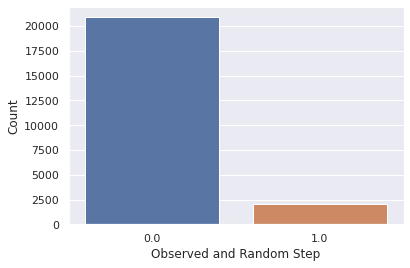

In [5]:
ax = sns.countplot(x = 'OBSERVED', data = female_clean)
ax.set_xlabel("Observed and Random Step")
ax.set_ylabel("Count")

Text(0, 0.5, 'Count')

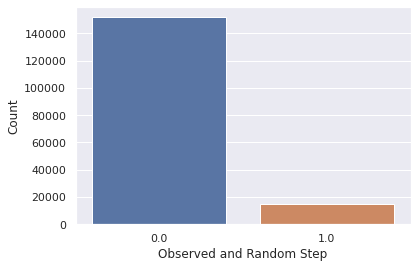

In [6]:
ax = sns.countplot(x = 'OBSERVED', data = male_clean)
ax.set_xlabel("Observed and Random Step")
ax.set_ylabel("Count")

Looking at the female vs male data and the observed value vs random state value, we are seeing that for every observed value, we will get 10 random values to test against. 

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


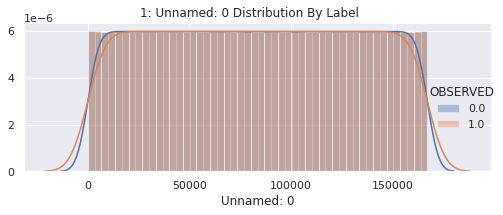

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


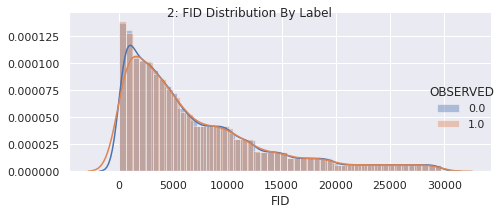

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate

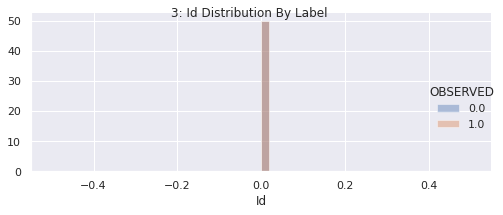

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


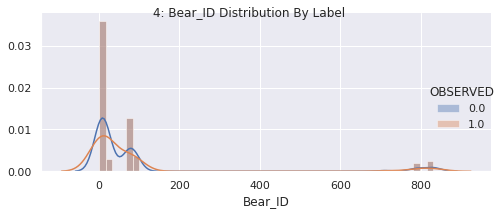

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


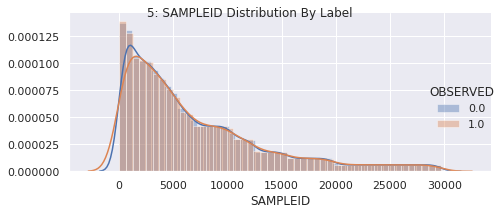

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


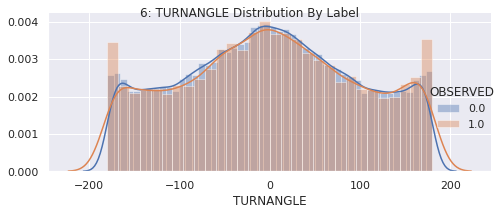

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


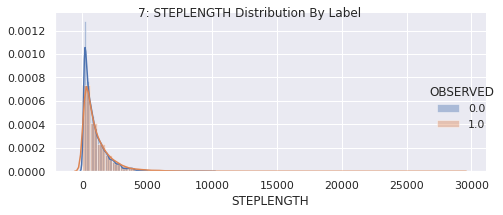

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


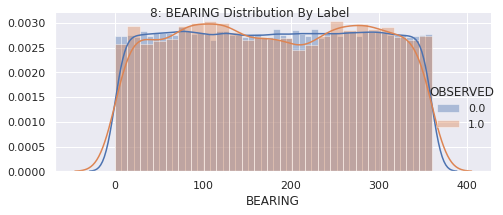

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


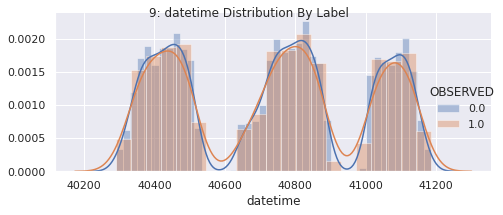

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


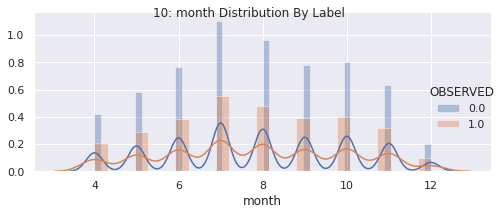

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


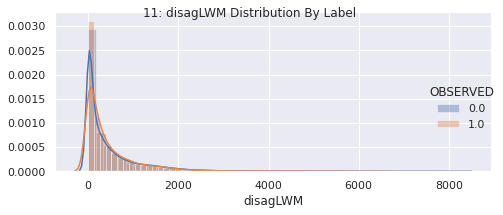

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


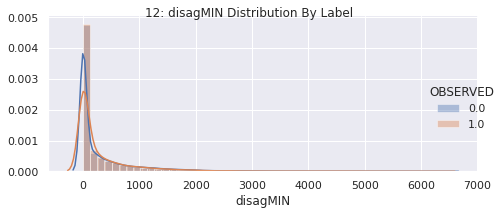

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


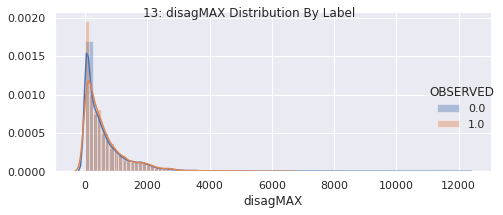

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


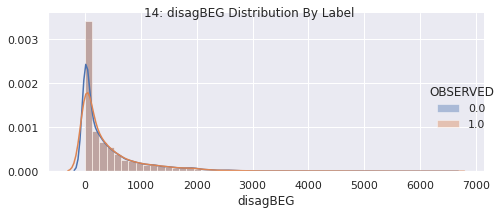

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


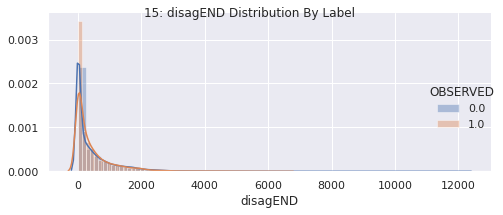

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


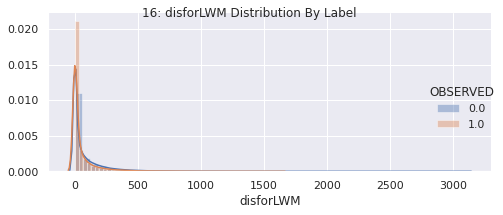

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


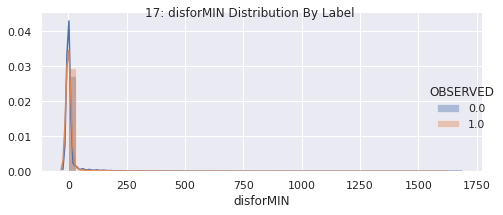

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


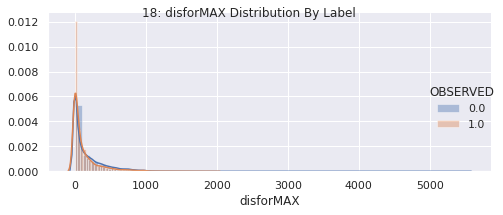

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


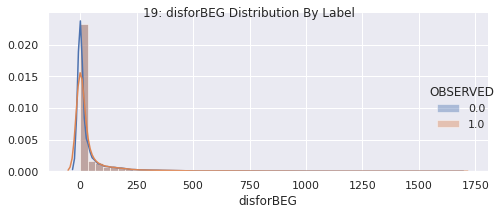

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


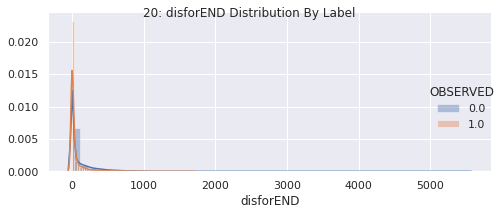

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


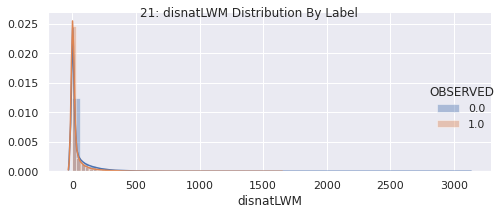

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


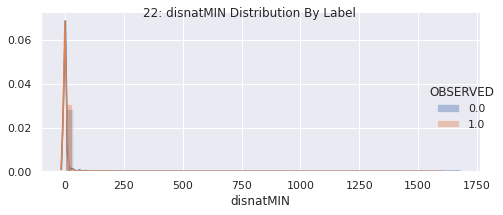

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


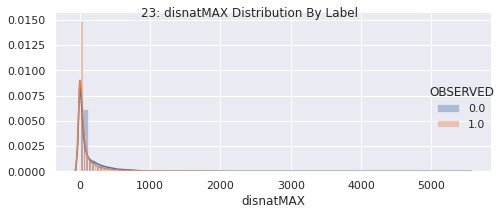

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


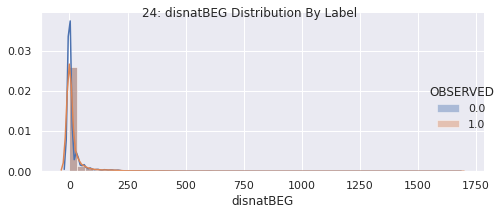

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


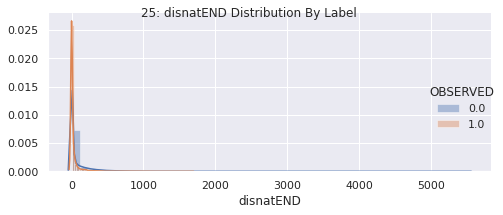

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


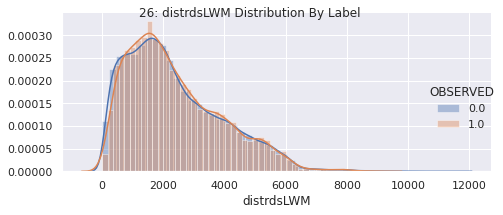

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


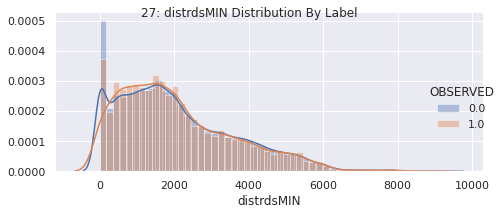

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


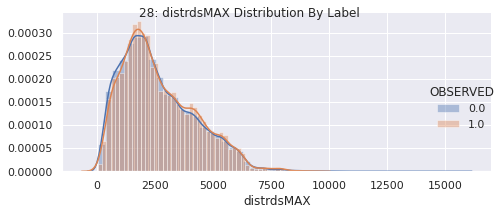

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


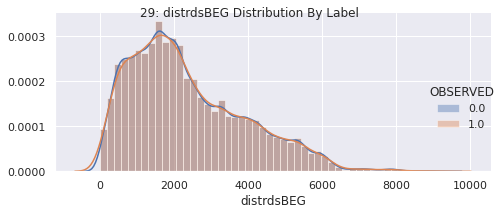

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


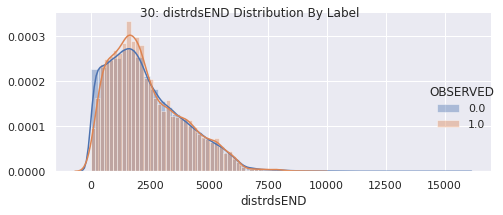

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


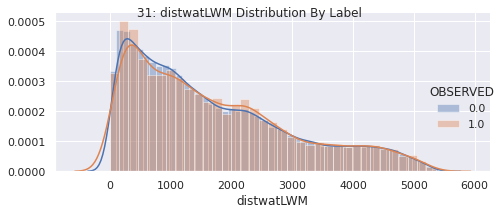

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


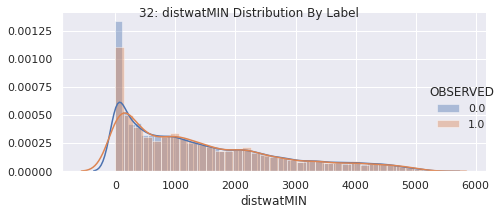

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


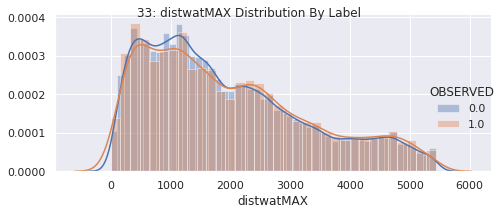

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


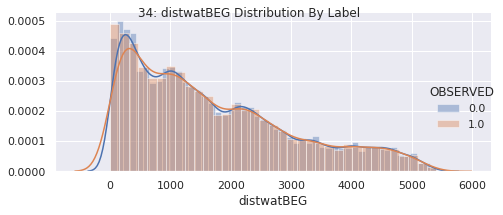

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


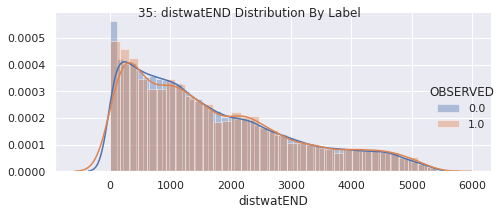

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


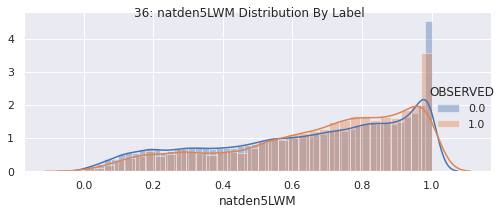

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


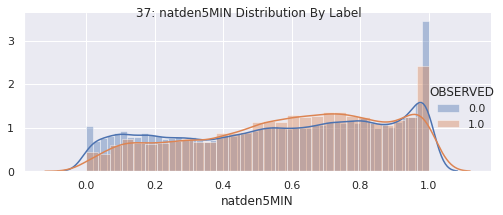

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


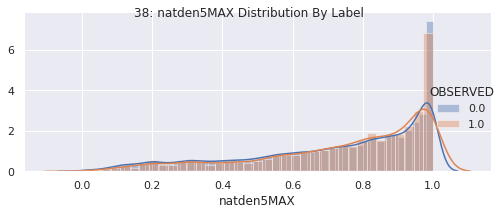

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


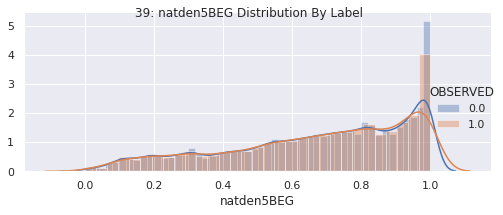

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


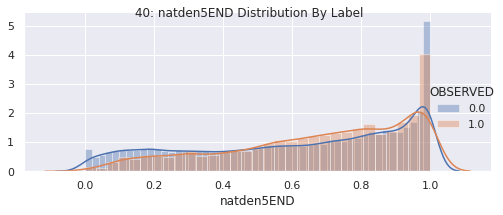

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


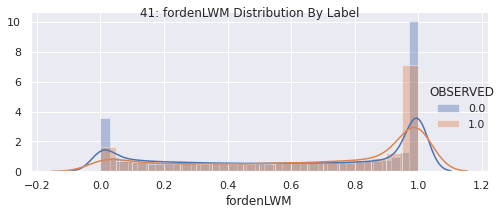

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


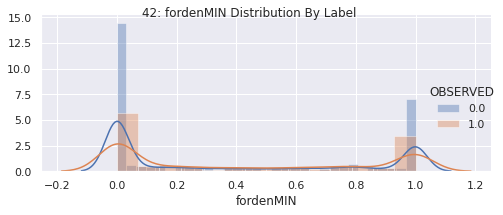

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


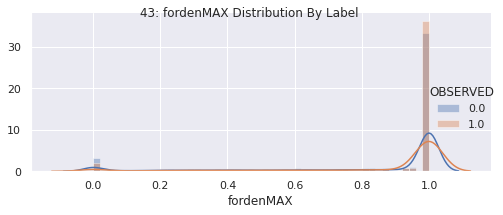

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


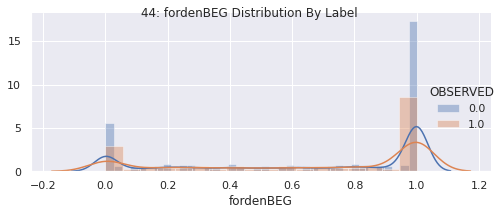

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


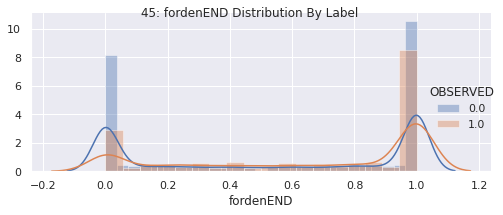

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


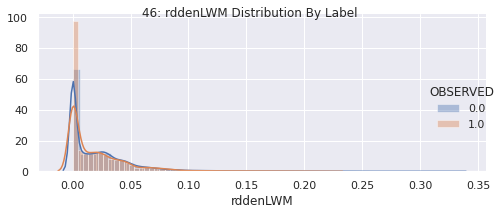

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


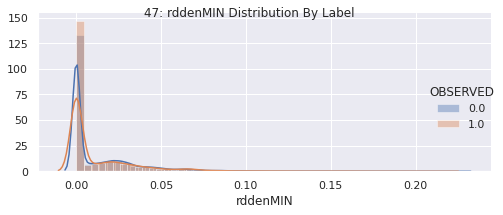

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


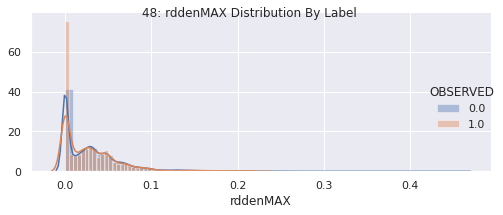

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


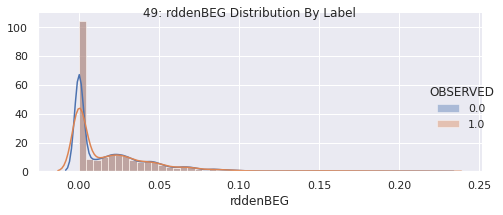

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


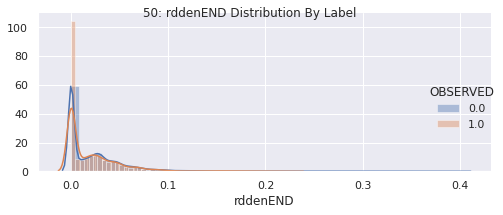

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


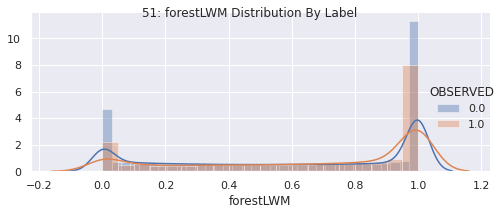

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


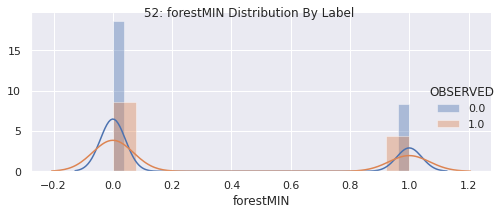

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


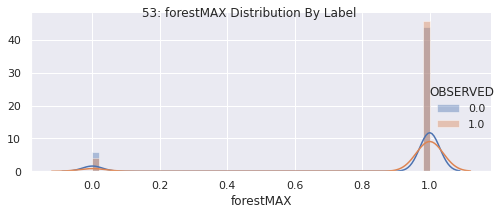

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


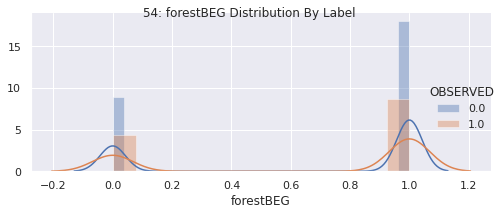

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


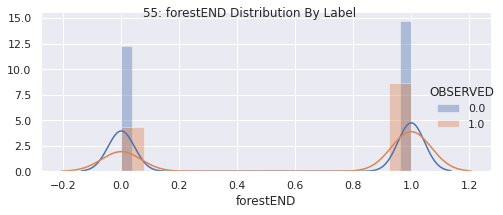

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


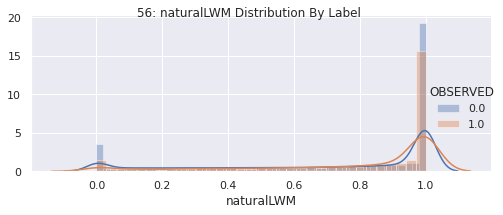

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


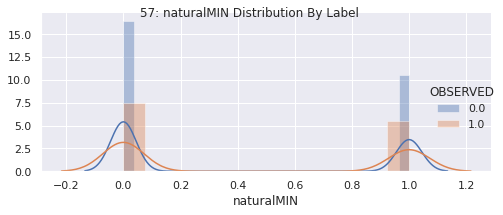

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


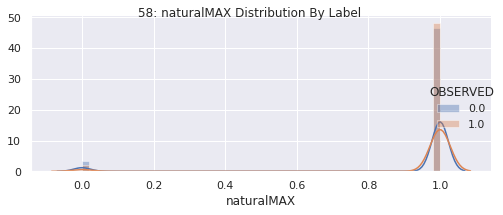

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


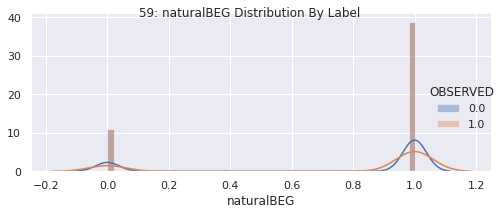

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


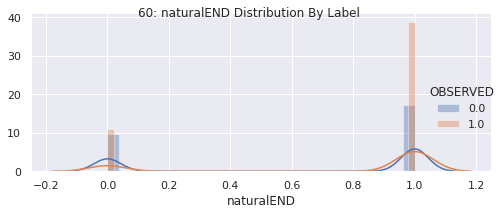

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


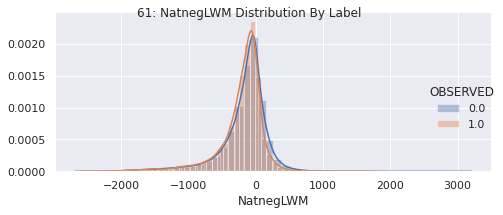

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


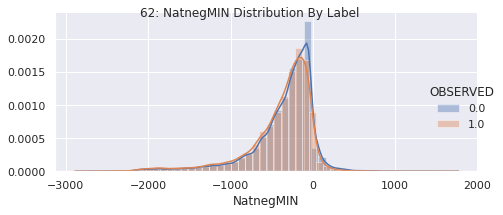

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


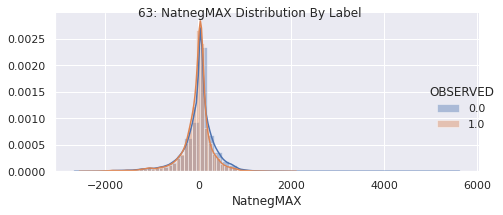

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


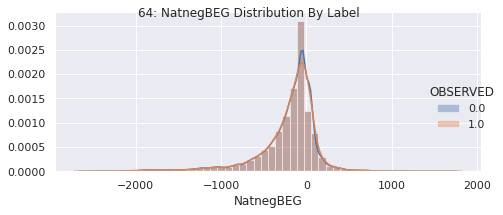

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


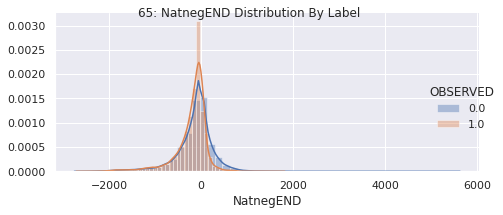

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


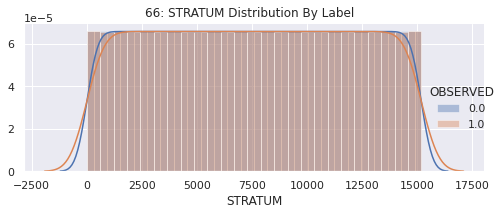

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


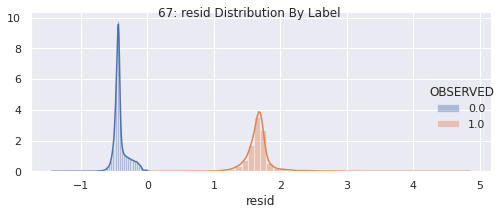

In [7]:

plt.rcParams['figure.max_open_warning']=40
plt.rcParams['figure.figsize']=(5,5)
colnames=list(male_clean.drop(['OBSERVED'], axis=1).select_dtypes(exclude='O').columns.values)
for i in colnames[0:]:
    facet = sns.FacetGrid(male_clean, hue='OBSERVED',aspect=2)
    facet.map(sns.distplot,i)
    facet.add_legend()
    facet.fig.suptitle(''.join(map(str, list([colnames.index(i)+1,": ",i," Distribution By Label"]))))
    plt.tight_layout()
    plt.show()

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


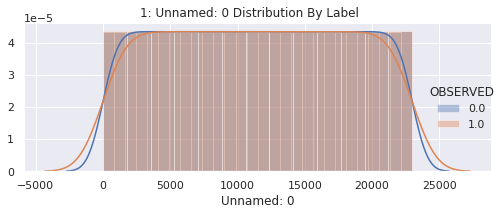

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


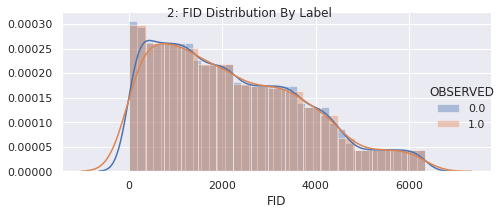

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate

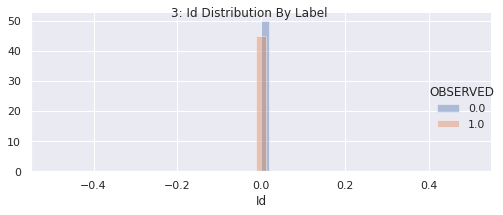

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


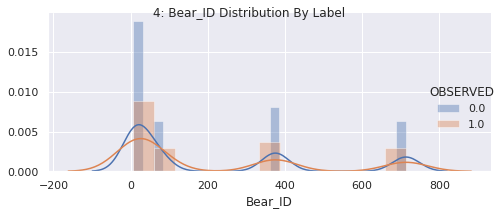

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


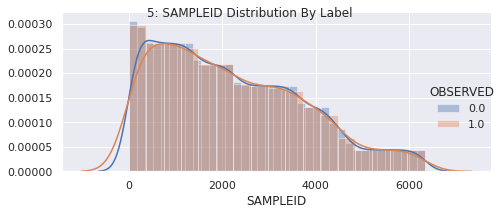

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


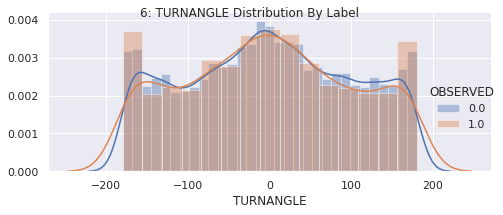

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


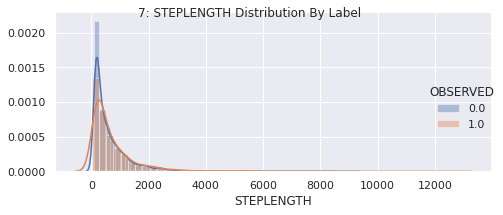

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


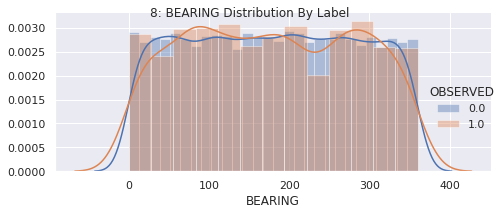

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


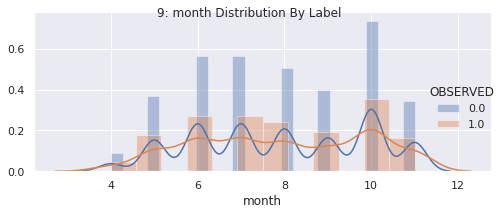

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


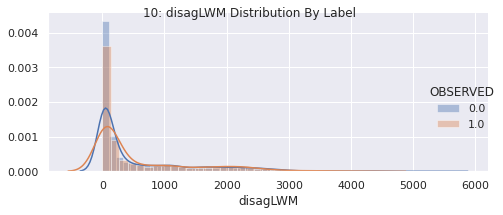

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


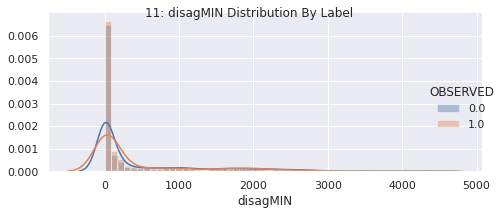

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


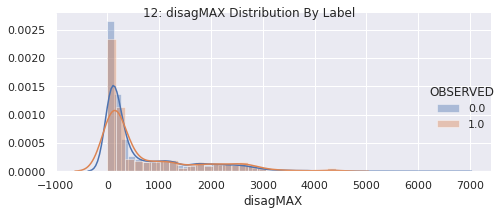

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


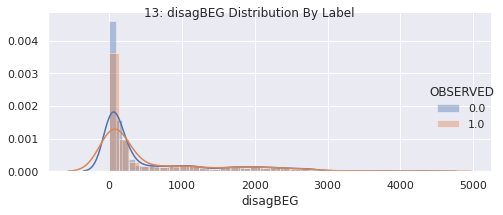

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


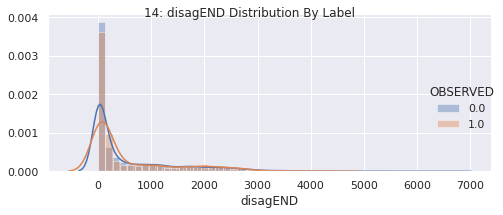

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


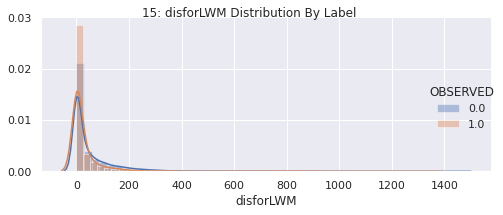

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


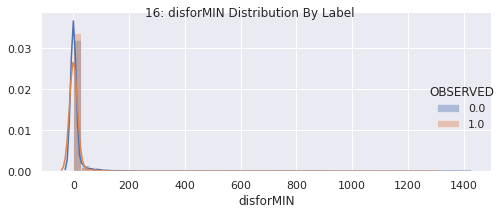

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


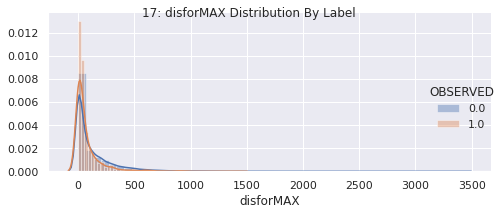

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


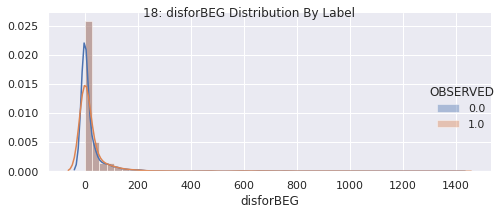

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


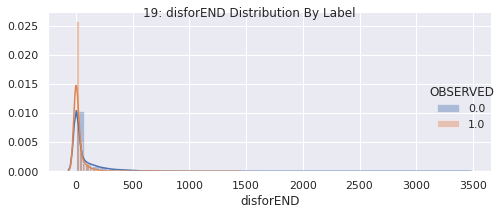

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


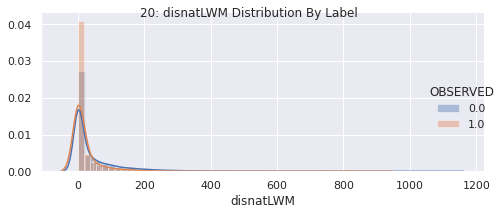

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


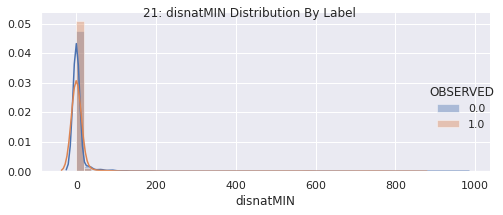

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


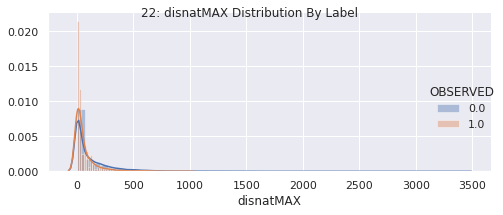

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


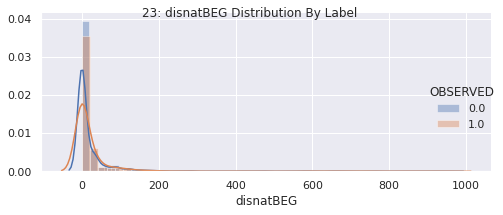

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


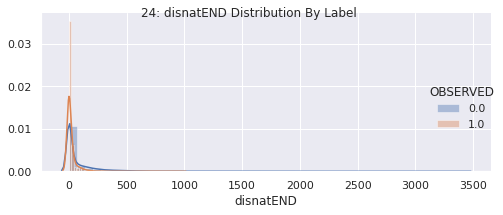

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


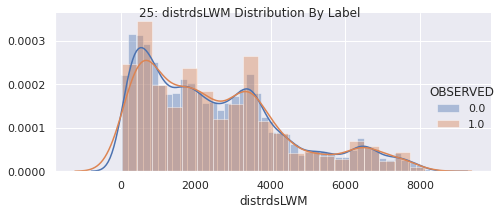

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


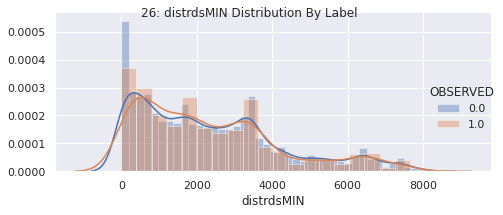

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


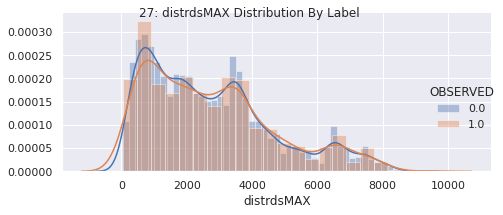

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


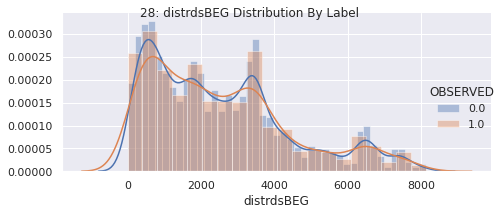

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


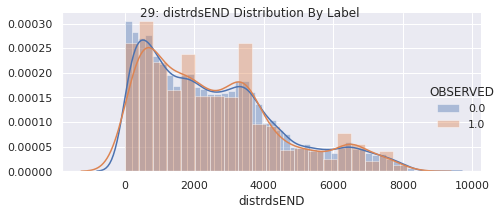

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


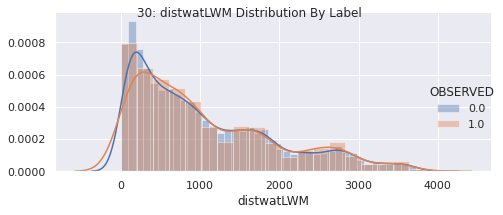

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


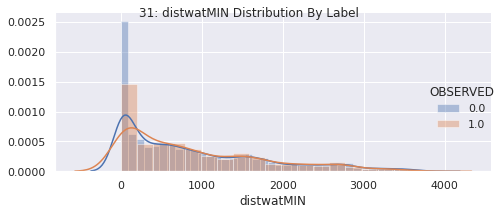

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


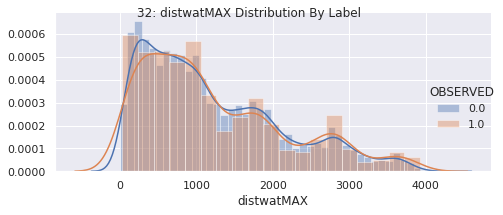

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


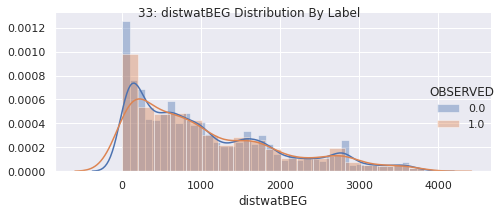

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


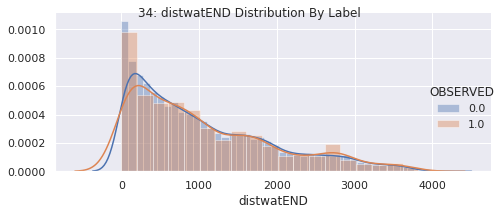

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


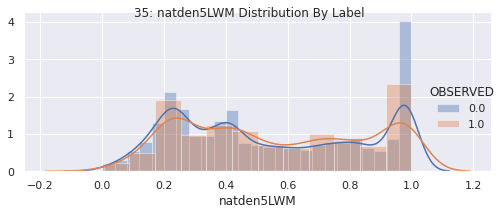

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


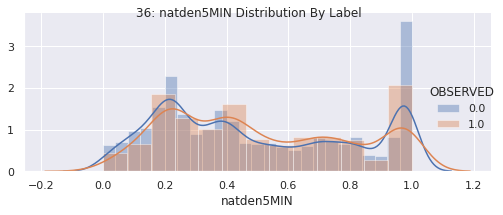

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


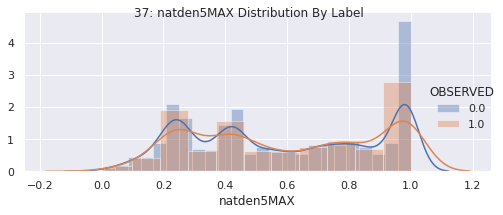

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


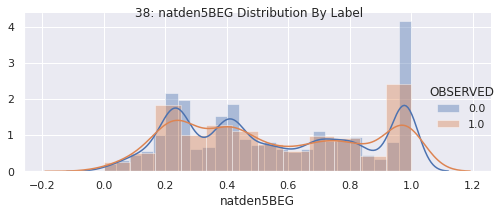

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


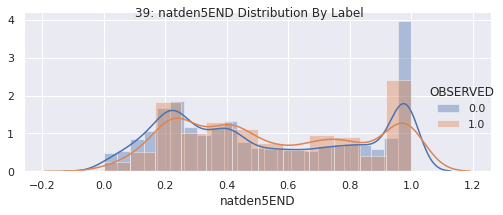

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


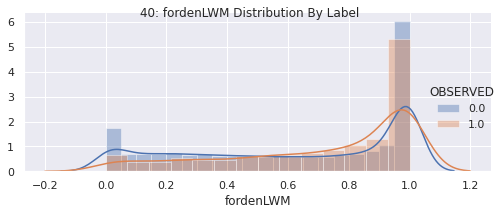

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


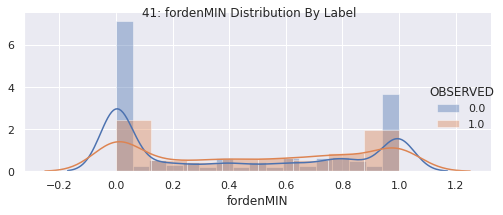

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


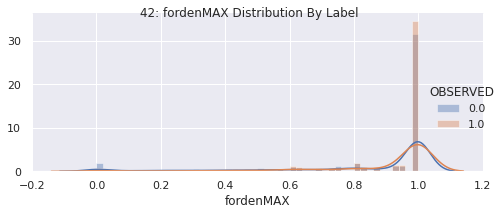

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


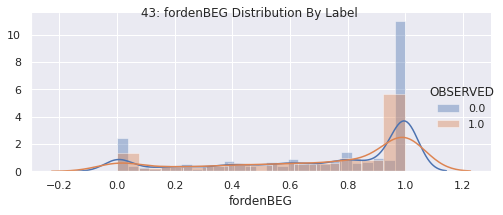

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


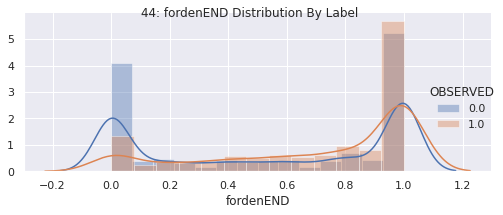

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


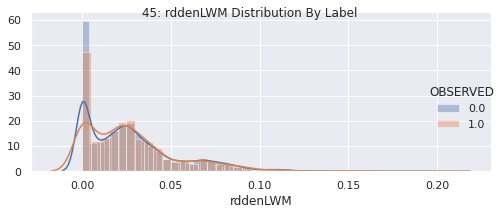

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


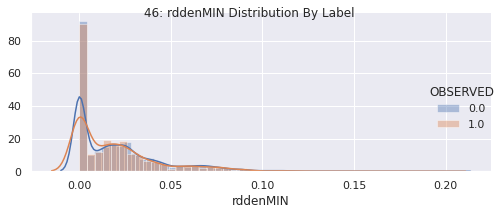

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


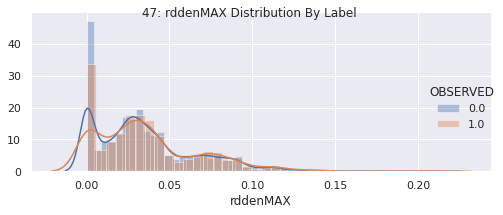

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


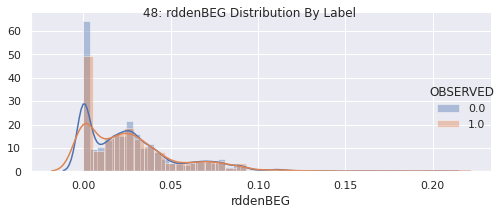

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


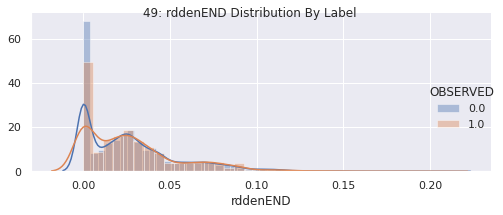

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


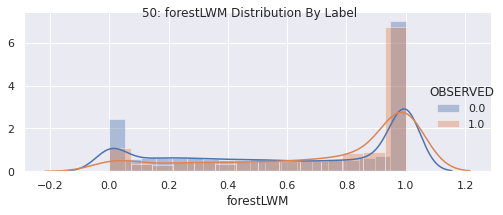

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


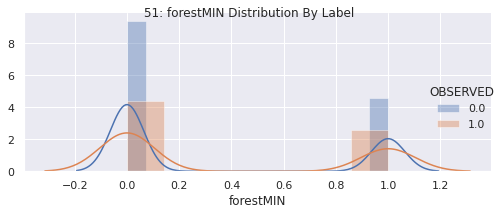

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


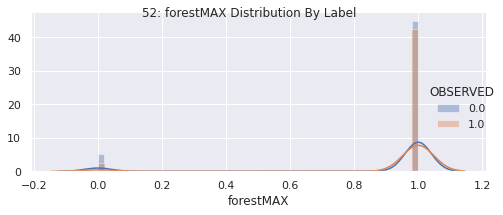

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


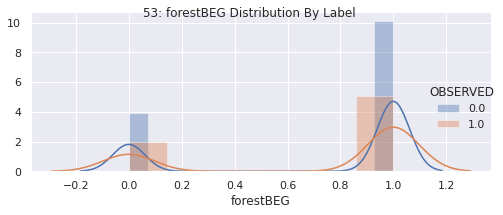

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


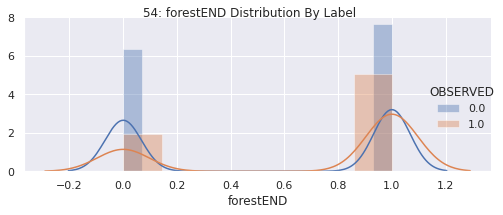

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


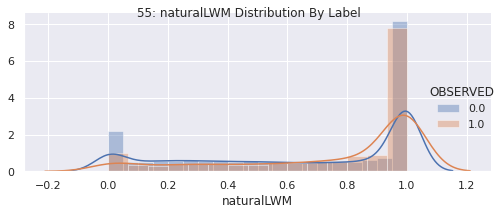

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


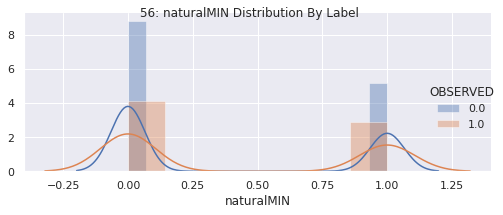

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


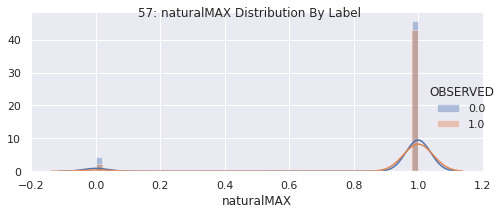

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


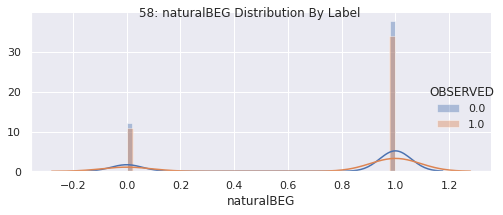

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


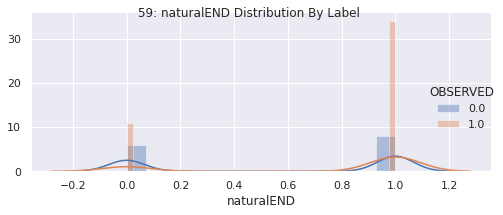

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


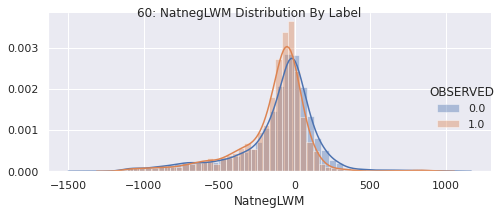

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


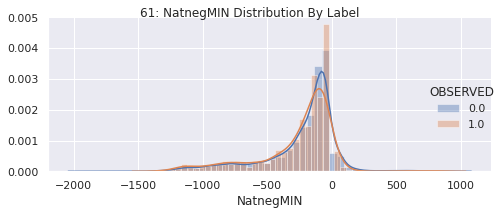

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


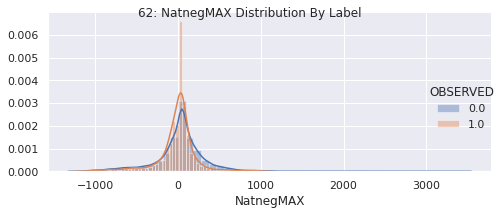

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


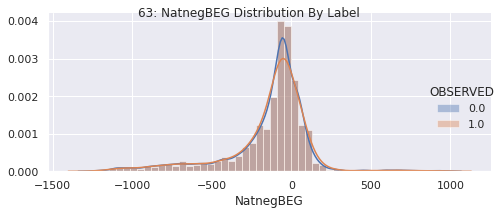

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


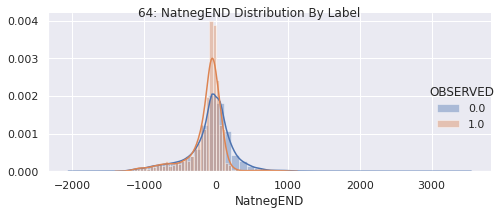

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


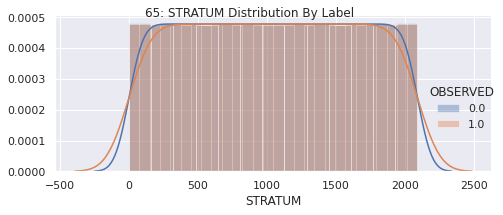

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


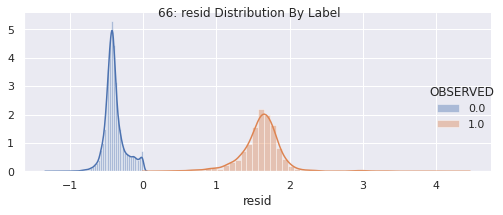

In [8]:
plt.rcParams['figure.max_open_warning']=40
plt.rcParams['figure.figsize']=(5,5)
colnames=list(female_clean.drop(['OBSERVED'], axis=1).select_dtypes(exclude='O').columns.values)
for i in colnames[0:]:
    facet = sns.FacetGrid(female_clean, hue='OBSERVED',aspect=2)
    facet.map(sns.distplot,i)
    facet.add_legend()
    facet.fig.suptitle(''.join(map(str, list([colnames.index(i)+1,": ",i," Distribution By Label"]))))
    plt.tight_layout()
    plt.show()

Looking at both male and female data and the distribution of continuous values, we can see that generally there are no glaring differences between the distribution of observed values vs random values outside of the residual data. So for our model, we wouuld likely want to remove residual as it might be overly indicative of performance. 

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


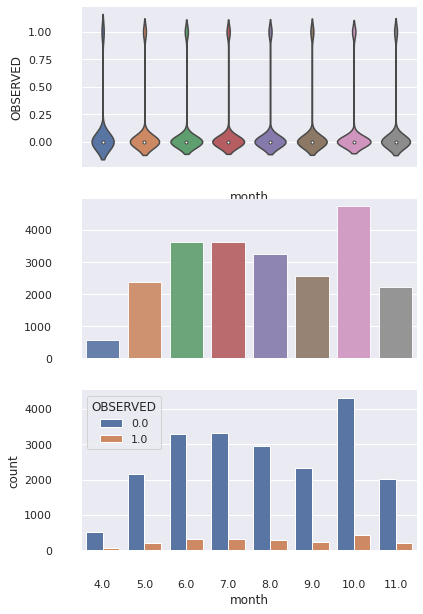

In [9]:
count = female_clean['month'].value_counts()
f, axes = plt.subplots(3, 1, figsize=(6, 10), sharex=True)
sns.barplot(count.index, count.values, alpha=0.9, ax=axes[1])
sns.violinplot(x="month", y="OBSERVED", data=female_clean, ax=axes[0])
sns.countplot(x = 'month', data = female_clean, hue = 'OBSERVED', ax=axes[2])
sns.despine(offset=20, trim=True)

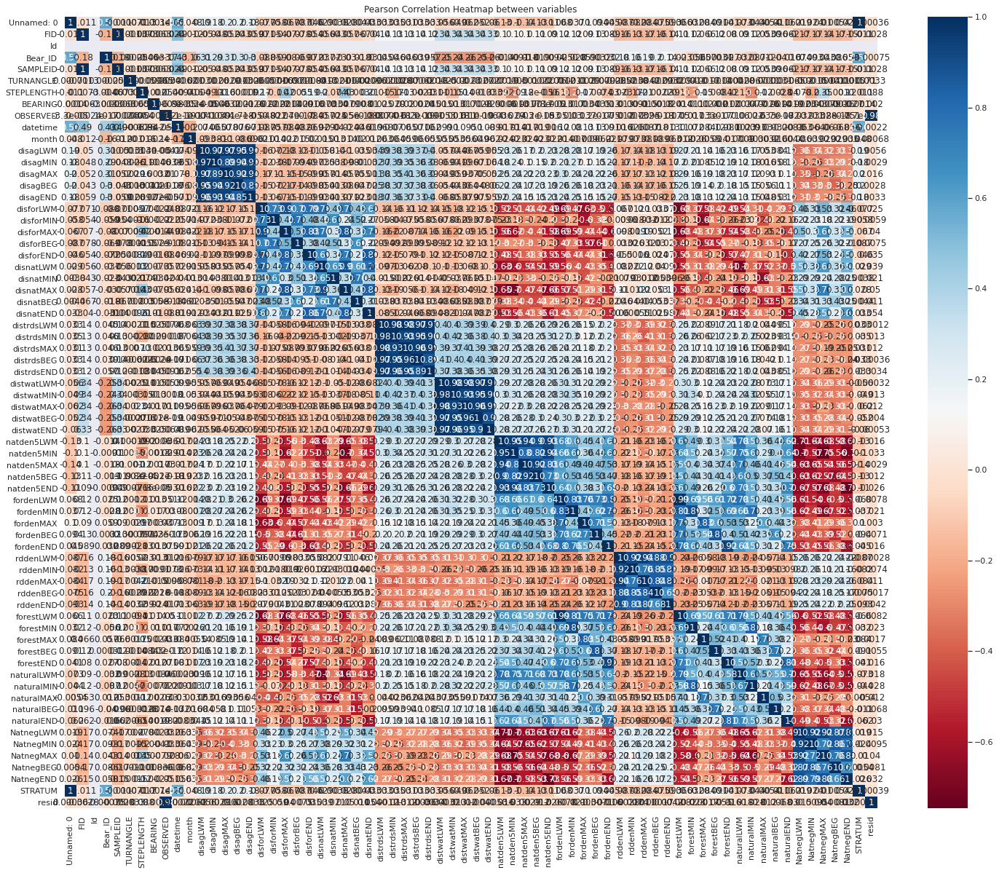

In [10]:
ax, fig = plt.subplots(figsize = (25,20))
sns.set(font_scale=1)
sns.heatmap(male_clean.corr(), annot=True, cmap = 'RdBu') 
plt.title("Pearson Correlation Heatmap between variables")
plt.show()

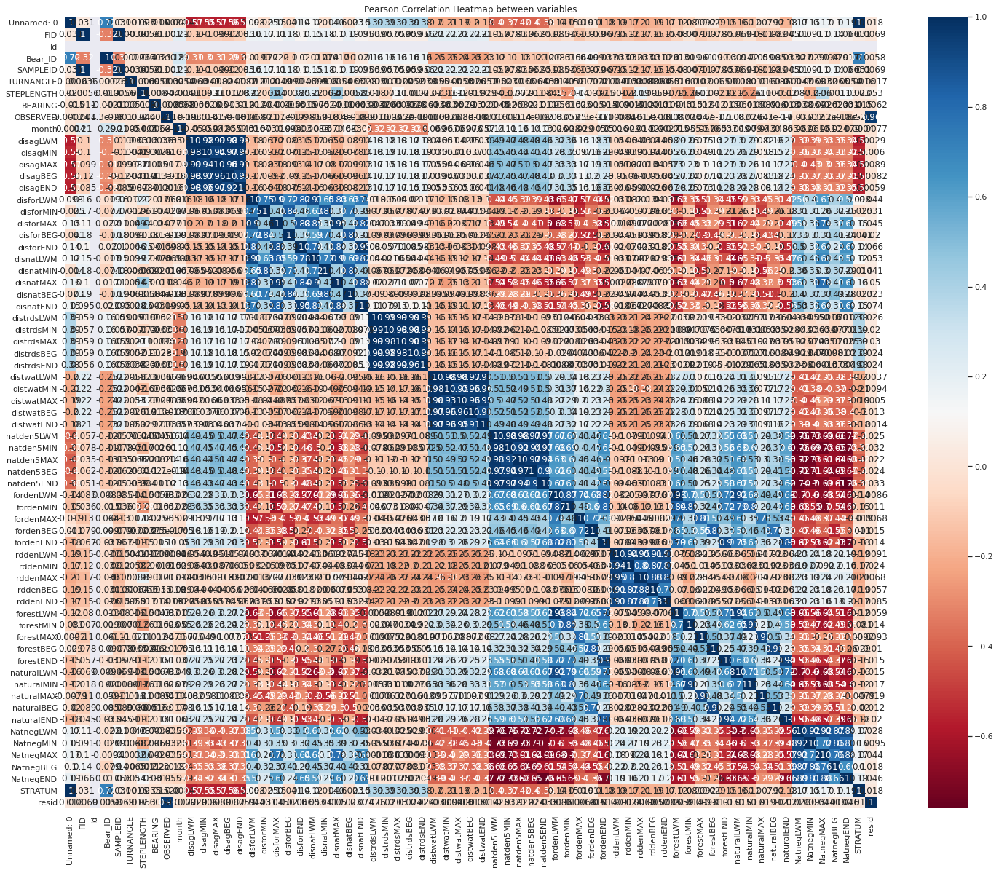

In [11]:

ax, fig = plt.subplots(figsize = (25,20))
sns.set(font_scale=1)
sns.heatmap(female_clean.corr(), annot=True, cmap = 'RdBu') 
plt.title("Pearson Correlation Heatmap between variables")
plt.show()

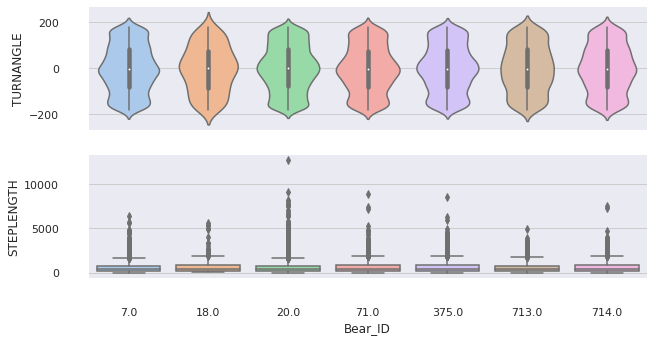

In [12]:

f, axes = plt.subplots(2, 1, figsize=(10, 5), sharex=True)
sns.set(style="ticks", palette="pastel")
sns.boxplot(x="Bear_ID", y="STEPLENGTH", data=female_clean, ax=axes[1])
sns.violinplot(x="Bear_ID", y="TURNANGLE", data=female_clean, ax=axes[0])
sns.despine(offset=20, trim=True)

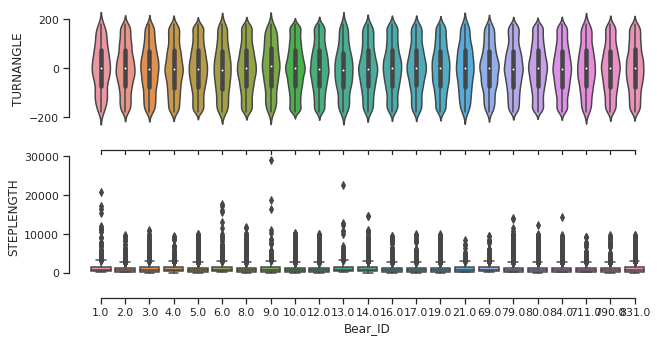

In [13]:
f, axes = plt.subplots(2, 1, figsize=(10, 5), sharex=True)
sns.set(style="ticks", palette="pastel")
sns.boxplot(x="Bear_ID", y="STEPLENGTH", data=male_clean, ax=axes[1])
sns.violinplot(x="Bear_ID", y="TURNANGLE", data=male_clean, ax=axes[0])
sns.despine(offset=20, trim=True)

In [14]:
## Baseline Classifier

In [15]:
pip install pathos

     |████████████████████████████████| 225kB 4.5MB/s 
     |████████████████████████████████| 112kB 14.2MB/s 
     |████████████████████████████████| 133kB 14.0MB/s 
  Created wheel for pathos: filename=pathos-0.2.6-cp36-none-any.whl size=77674 sha256=c75e70cf90e8cb06b164ab6c9f8f152e6251effcd64ff50cb31d8be733df9dc5
  Stored in directory: /root/.cache/pip/wheels/3a/e8/c8/04cdd0c4bc6fbce35f642fc004244228916daae74bb0f482da
  Created wheel for ppft: filename=ppft-1.6.6.2-cp36-none-any.whl size=64743 sha256=78fb0d8537dbfa19c8ee8b03d4cc093e553002847bffafb3a2eeff366413758d
  Stored in directory: /root/.cache/pip/wheels/db/d2/2d/0ee21ede61786bb13247dbc69079373fd500c2bb0481913084
  Created wheel for pox: filename=pox-0.2.8-cp36-none-any.whl size=28290 sha256=583f3e44cbd4ae7c954c1276b040e41538f86fa70a8c0a67517d0d1571f85b09
  Stored in directory: /root/.cache/pip/wheels/39/ed/ce/a93103746b327e18bffaeb99ba0d57a88b392f31d719cea700
Successfully built pathos ppft pox


In [16]:

%matplotlib inline

import numpy as np
import pandas as pd
#import modin.pandas as pd
import matplotlib.pyplot as plt

#import cufflinks as cf
#cf.go_offline()
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import svm
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

%matplotlib inline
import numpy as np
import seaborn as sns; sns.set()

from pathos.multiprocessing import ProcessingPool as Pool
import multiprocessing as mp

### Goal 

Given the male and female bear dataset. Predict the response "OBSERVED" using the feature set consisting of the location and GPS coordinates data. Identify the optmized model and feature set that maximizes the accuracy and minimizes cost given the following constraints. 



In [ ]:
male_clean.head()

,Unnamed: 0,FID,Id,Bear_ID,SAMPLEID,TURNANGLE,STEPLENGTH,BEARING,OBSERVED,datetime,...,naturalMAX,naturalBEG,naturalEND,NatnegLWM,NatnegMIN,NatnegMAX,NatnegBEG,NatnegEND,STRATUM,resid
0,1.0,0.0,0.0,1.0,0.0,-30.452138,1517.096556,206.512289,1.0,40312.87,...,1.0,1.0,1.0,-532.332639,-1094.897217,30.0,-1050.0,-123.693169,1.0,1.618859
1,2.0,1.0,0.0,1.0,1.0,86.333287,129.714618,323.297713,0.0,40312.87,...,1.0,1.0,1.0,-1094.048479,-1140.394653,-1050.0,-1050.0,-1140.394653,1.0,-0.432693
2,3.0,2.0,0.0,1.0,2.0,64.160478,202.879209,301.124905,0.0,40312.87,...,1.0,1.0,1.0,-1142.342003,-1230.365845,-1050.0,-1050.0,-1230.365845,1.0,-0.431176
3,4.0,3.0,0.0,1.0,3.0,76.329050,592.086980,313.293477,0.0,40312.87,...,1.0,1.0,1.0,-1279.810606,-1500.299927,-1050.0,-1050.0,-1471.223999,1.0,-0.411518
4,5.0,4.0,0.0,1.0,4.0,95.750746,488.597687,332.715173,0.0,40312.87,...,1.0,1.0,1.0,-1182.258755,-1339.290894,-1050.0,-1050.0,-1339.290894,1.0,-0.413950


In [ ]:
#male_clean['datetime'].replace('/', '-')

In [ ]:
male_clean.head()

,Unnamed: 0,FID,Id,Bear_ID,SAMPLEID,TURNANGLE,STEPLENGTH,BEARING,OBSERVED,datetime,...,naturalMAX,naturalBEG,naturalEND,NatnegLWM,NatnegMIN,NatnegMAX,NatnegBEG,NatnegEND,STRATUM,resid
0,1.0,0.0,0.0,1.0,0.0,-30.452138,1517.096556,206.512289,1.0,40312.87,...,1.0,1.0,1.0,-532.332639,-1094.897217,30.0,-1050.0,-123.693169,1.0,1.618859
1,2.0,1.0,0.0,1.0,1.0,86.333287,129.714618,323.297713,0.0,40312.87,...,1.0,1.0,1.0,-1094.048479,-1140.394653,-1050.0,-1050.0,-1140.394653,1.0,-0.432693
2,3.0,2.0,0.0,1.0,2.0,64.160478,202.879209,301.124905,0.0,40312.87,...,1.0,1.0,1.0,-1142.342003,-1230.365845,-1050.0,-1050.0,-1230.365845,1.0,-0.431176
3,4.0,3.0,0.0,1.0,3.0,76.329050,592.086980,313.293477,0.0,40312.87,...,1.0,1.0,1.0,-1279.810606,-1500.299927,-1050.0,-1050.0,-1471.223999,1.0,-0.411518
4,5.0,4.0,0.0,1.0,4.0,95.750746,488.597687,332.715173,0.0,40312.87,...,1.0,1.0,1.0,-1182.258755,-1339.290894,-1050.0,-1050.0,-1339.290894,1.0,-0.413950


In [ ]:
#pd.to_timedelta(male_clean.datetime).dt.total_seconds()

In [ ]:
#create a holdout set
from sklearn.model_selection import train_test_split
male_clean_x, unseen_x_test, male_clean_y, unseen_y_test = train_test_split(male_clean.loc[:, male_clean.columns != 'OBSERVED'], male_clean['OBSERVED'], test_size=0.30, stratify=male_clean['STRATUM'],random_state=42)

To begin our prediction modeling, we will create a train / test split on the X and Y variables using a 70/30 ratio between training and testing. Since we have an offbalanced Y variable, we will use stratified sampling of our OBSERVED values using STRATUM to make sure we have a significant amount of observations in each binary to best ensure our classifier is fair.

In [ ]:
print(unseen_x_test.shape)
print(unseen_y_test.shape)

male_clean_x.reset_index(drop=True, inplace=True)
unseen_x_test.reset_index(drop=True, inplace=True)
male_clean_y.reset_index(drop=True, inplace=True)
unseen_y_test.reset_index(drop=True, inplace=True)

(50118, 68)
(50118,)



Now that we divided up our train and test split, we can see that our testing set has over 50,000 observations. While, as we know, the x dataframe will have 68 columns.

In [ ]:
#pip install pycaret

In [ ]:
#pip install parse_version

In [ ]:

##TRAIN
#scale the test data seperately from the unseen holdout set
from sklearn import preprocessing
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
imp = IterativeImputer(max_iter=10, random_state=0)

x = male_clean_x.loc[:, male_clean_x.dtypes == 'float64'].values #returns a numpy array
#min_max_scaler = preprocessing.MinMaxScaler()
#x_scaled = min_max_scaler.fit_transform(x)
x = imp.fit_transform(x)
x = pd.DataFrame(x)
x.columns = male_clean_x.loc[:, male_clean_x.dtypes == 'float64'].columns
unscaled = pd.concat([male_clean_x, male_clean_y], axis=1)

##HOLDOUT
#scale the test data seperately from the unseen holdout set
from sklearn import preprocessing
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
imp = IterativeImputer(max_iter=10, random_state=0)

x = unseen_x_test.loc[:, unseen_x_test.dtypes == 'float64'].values #returns a numpy array
#min_max_scaler = preprocessing.MinMaxScaler()
#x_scaled = min_max_scaler.fit_transform(x)
x = imp.fit_transform(x)
x = pd.DataFrame(x)
x.columns = unseen_x_test.loc[:, unseen_x_test.dtypes == 'float64'].columns
x = pd.DataFrame(x)
unseen_x = pd.concat([unseen_x_test, unseen_y_test], axis=1)

unscaled.info()


Now that we applied our cleaning data to our x data frame, we see that we have nearly 116k observations



In [ ]:

#from pycaret.classification import *
#intialize the setup

#exp_clf = setup(unscaled
#                ,target = 'OBSERVED'
#                ,train_size = 0.7
#                ,profile = False
#                ,remove_multicollinearity = True
#                ,polynomial_features = False
#                ,feature_interaction = True
#                ,feature_ratio = False
#                ,feature_selection = True
#                #,fix_imbalance = True
#                ,silent=True
#                #,cluster = True
#                ,pca = False
#                ,numeric_imputation = 'mean'
#                ,normalize=True
#                ,categorical_features = ['datetime', 'CLUSTER']
#                #,n_jobs=32
#               )

In [ ]:
# compare all baseline models and select top 5
#top5 = compare_models(n_select = 5)

In [ ]:
#catboost = create_model(estimator = 'catboost', ensemble = True, method='Bagging')

In [ ]:
# select best model 
#best = automl(optimize = 'MCC')

In [ ]:
#plot_model(best)


## Random Forest Classifier

In [ ]:
# Import all necessary libraries we will be using in our dataset

import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import math
import re
import sklearn
import statistics
import random

from sklearn.feature_selection import SelectKBest, chi2, SelectPercentile, RFE, SelectFromModel

from sklearn.preprocessing import StandardScaler, Binarizer

from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.svm import SVC, LinearSVC

from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, auc, roc_curve
from IPython.display import display, HTML

from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, TimeSeriesSplit, StratifiedShuffleSplit

from sklearn.naive_bayes import MultinomialNB

from sklearn.ensemble import GradientBoostingClassifier,GradientBoostingRegressor,AdaBoostClassifier,RandomForestClassifier, BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

%matplotlib inline

matplotlib.style.use('ggplot')

import warnings
warnings.filterwarnings('ignore')

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn import metrics as mt
cv = StratifiedKFold(n_splits=10,shuffle=True,random_state=101)
#separating input data into two parts X (features) and Y (target)

In [ ]:
#SVM_SGD 10-fold cross-validation 

param_grid = { 'loss': ['modified_huber']
              ,'penalty':['l2']
              ,'alpha': [0.01, 0.1, 1, 10]
              ,'class_weight': ['balanced', None]
              ,'random_state': [101]
              ,'max_iter':[1000,1500]
              
             }

clf_SVM = SGDClassifier()
#Create a grid search object using the above parameters 
from sklearn.model_selection import GridSearchCV
SVMGridSearch = GridSearchCV(clf_SVM, param_grid=param_grid, cv=cv,n_jobs=8, verbose=1, scoring='roc_auc' )

#Perform hyperparameter search to find the best combination of parameters for our data
SVMGridSearch.fit(male_clean_x,y=male_clean_y.values.ravel())
y_SVM_score = SVMGridSearch.predict(male_clean_x)

y_SVM_prob=SVMGridSearch.predict_proba(male_clean_x)

Fitting 10 folds for each of 16 candidates, totalling 160 fits


[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:  8.1min
[Parallel(n_jobs=8)]: Done 160 out of 160 | elapsed: 32.9min finished


In [ ]:
classifierEstimaterSVM =SVMGridSearch.best_estimator_
classifierEstimaterSVM

SGDClassifier(alpha=0.01, average=False, class_weight='balanced',
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='modified_huber',
              max_iter=1000, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=101, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)

In [ ]:
from sklearn.model_selection import cross_validate
from sklearn.model_selection import StratifiedKFold
def EvaluateClassifierEstimator(classifierEstimator, X, Y, cv):



#Perform cross validation 
    scores = cross_validate(classifierEstimator, X, Y,
                            scoring=['accuracy', 'precision','recall'], 
                            cv=cv, return_train_score=True, 
                            )

    Accavg = scores['test_accuracy'].mean()
    Preavg = scores['test_precision'].mean()
    Rreavg = scores['test_recall'].mean()

    print_str = "The average accuracy for all cv folds is: \t\t\t {Accavg:.5}"
    print_str2 = "The average precision for all cv folds is: \t\t\t {Preavg:.5}"
    print_str3 = "The average Recall for all cv folds is: \t\t\t {Rreavg:.5}"

    print(print_str.format(Accavg=Accavg))
    print(print_str2.format(Preavg=Preavg))
    print(print_str3.format(Rreavg=Rreavg))
    print('*********************************************************')

    print('Cross Validation Fold Mean Error Scores')
    scoresResults = pd.DataFrame()
    scoresResults['Accuracy'] = scores['test_accuracy']
    scoresResults['Precision'] = scores['test_precision']
    scoresResults['Recall'] = scores['test_recall']
    print(scoresResults)
    return scoresResults

SVM_scores = EvaluateClassifierEstimator(classifierEstimaterSVM,male_clean_x,male_clean_y,cv)

The average accuracy for all cv folds is: 			 0.54428
The average precision for all cv folds is: 			 0.184
The average Recall for all cv folds is: 			 0.50648
*********************************************************
Cross Validation Fold Mean Error Scores
   Accuracy  Precision    Recall
0  0.907730   0.443396  0.044049
1  0.880195   0.189591  0.095595
2  0.097742   0.091848  0.999064
3  0.122114   0.093656  0.992509
4  0.147426   0.095290  0.981273
5  0.870617   0.171344  0.108614
6  0.902685   0.253521  0.033708
7  0.378485   0.109965  0.818352
8  0.231914   0.102471  0.955056
9  0.903874   0.288889  0.036551


In [ ]:
from sklearn.metrics import roc_curve, auc
fprSVM = dict()
tprSVM = dict()
roc_auc_SVM = dict()
for i in np.unique(male_clean_y):
    fprSVM[i], tprSVM[i], _ = mt.roc_curve(male_clean_y, y_SVM_prob[:,i], pos_label=i)
    roc_auc_SVM[i] = mt.auc(fprSVM[i], tprSVM[i])
plt.figure(figsize=(12,8));    
for i in np.unique(male_clean_y):
    plt.plot(fprSVM[i], tprSVM[i], label= ('class %d (area = %0.2f)' % (i, roc_auc_SVM[i])))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

plt.title('Receiver operating characteristic for SVM classifier')
plt.legend(loc="lower right")  
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [ ]:
def EvaluateClassifierEstimator2(classifierEstimator, X, Y2, cv):
    
  #Perform cross validation 
  from sklearn.model_selection import cross_val_predict
  predictions = cross_val_predict(classifierEstimator, 
                                  X, Y2, cv=cv)
    
#model evaluation 
  from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

#pass true test set values and predictions to classification_report
  classReport = classification_report(Y2,predictions)
  confMat = confusion_matrix(Y2,predictions)
  acc = accuracy_score(Y2,predictions)
    
  print(classReport)
  print(confMat)
  print(acc)

In [ ]:
EvaluateClassifierEstimator2(classifierEstimaterSVM, male_clean_x, male_clean_y, cv)


              precision    recall  f1-score   support

         0.0       0.92      0.55      0.69    106262
         1.0       0.10      0.51      0.17     10677

    accuracy                           0.54    116939
   macro avg       0.51      0.53      0.43    116939
weighted avg       0.84      0.54      0.64    116939

[[58238 48024]
 [ 5268  5409]]
0.5442752204140621


#### Model 2: KNN with Grid Search

In [ ]:
param_grid = [
    {
         'weights': ['uniform','distance'],
         'leaf_size': [10,30],
         'metric': ['minkowski','euclidean'],
         'n_neighbors':[13,15,17],
         
    }
]
clf_KNN = KNeighborsClassifier()
grid_search_KNN = GridSearchCV(clf_KNN, param_grid=param_grid,cv=cv,n_jobs=8, verbose=1, scoring='roc_auc' )

KNearest_model = grid_search_KNN.fit(male_clean_x, male_clean_y.values.ravel())
y_KNN_score = grid_search_KNN.predict(male_clean_x)

y_KNN_prob=grid_search_KNN.predict_proba(male_clean_x)

Fitting 10 folds for each of 24 candidates, totalling 240 fits


[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:  2.6min
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed: 14.3min
[Parallel(n_jobs=8)]: Done 240 out of 240 | elapsed: 18.3min finished


In [ ]:
classifierEstimaterKNN = KNearest_model.best_estimator_
classifierEstimaterKNN

KNeighborsClassifier(algorithm='auto', leaf_size=10, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=17, p=2,
                     weights='distance')

In [ ]:
KNearest_scores = EvaluateClassifierEstimator(classifierEstimaterKNN,male_clean_x, male_clean_y,cv=cv)


The average accuracy for all cv folds is: 			 0.90887
The average precision for all cv folds is: 			 0.53778
The average Recall for all cv folds is: 			 0.013112
*********************************************************
Cross Validation Fold Mean Error Scores
   Accuracy  Precision    Recall
0  0.908757   0.500000  0.014995
1  0.909270   0.636364  0.013121
2  0.908244   0.380952  0.007491
3  0.909099   0.586207  0.015918
4  0.909526   0.647059  0.020599
5  0.908671   0.500000  0.009363
6  0.909441   0.714286  0.014045
7  0.908244   0.407407  0.010300
8  0.909013   0.576923  0.014045
9  0.908407   0.428571  0.011246


In [ ]:
EvaluateClassifierEstimator2(classifierEstimaterKNN, male_clean_x, male_clean_y,cv=cv)


              precision    recall  f1-score   support

         0.0       0.91      1.00      0.95    106262
         1.0       0.54      0.01      0.03     10677

    accuracy                           0.91    116939
   macro avg       0.72      0.51      0.49    116939
weighted avg       0.88      0.91      0.87    116939

[[106142    120]
 [ 10537    140]]
0.9088670161366182


In [ ]:
fprKNN = dict()
tprKNN = dict()
roc_auc_KNN = dict()
for i in np.unique(male_clean_y):
    fprKNN[i], tprKNN[i], _ = mt.roc_curve(male_clean_y, y_KNN_prob[:, i], pos_label=i)
    roc_auc_KNN[i] = mt.auc(fprKNN[i], tprKNN[i])
plt.figure(figsize=(12,8));    
for i in np.unique(male_clean_y):
    plt.plot(fprKNN[i], tprKNN[i], label= ('class %d (area = %0.2f)' % (i, roc_auc_KNN[i])))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

plt.title('Receiver operating characteristic for KNN classifier')
plt.legend(loc="lower right")  
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

### Model 3: Random Forest

In [ ]:

param_grid = [
    {
         'n_estimators': [200, 500], 
         'max_depth': [5,10,15],
         'random_state':[101]
     }
]

clf_RF = RandomForestClassifier()
grid_search_RF = GridSearchCV(clf_RF, param_grid=param_grid, cv=cv,n_jobs=8, verbose=1, scoring='roc_auc' )

RandomForest_model = grid_search_RF.fit(male_clean_x, male_clean_y.values.ravel())

y_RF_score = grid_search_RF.predict(male_clean_x)
y_RF_prob=grid_search_RF.predict_proba(male_clean_x)

Fitting 10 folds for each of 6 candidates, totalling 60 fits


[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed: 37.2min
[Parallel(n_jobs=8)]: Done  60 out of  60 | elapsed: 67.6min finished


In [ ]:

classifierEstimaterRF = RandomForest_model.best_estimator_
classifierEstimaterRF

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=5, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=101,
                       verbose=0, warm_start=False)

In [ ]:
Random_Forest_scores = EvaluateClassifierEstimator(classifierEstimaterRF,male_clean_x, male_clean_y,cv=cv)


The average accuracy for all cv folds is: 			 0.98709
The average precision for all cv folds is: 			 1.0
The average Recall for all cv folds is: 			 0.85859
*********************************************************
Cross Validation Fold Mean Error Scores
   Accuracy  Precision    Recall
0  0.991021        1.0  0.901593
1  0.992817        1.0  0.921275
2  0.989567        1.0  0.885768
3  0.963828        1.0  0.603933
4  0.994869        1.0  0.943820
5  0.987173        1.0  0.859551
6  0.996836        1.0  0.965356
7  0.971096        1.0  0.683521
8  0.991278        1.0  0.904494
9  0.992389        1.0  0.916589


In [ ]:
EvaluateClassifierEstimator2(classifierEstimaterRF,male_clean_x, male_clean_y,cv=cv)


              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99    106262
         1.0       1.00      0.86      0.92     10677

    accuracy                           0.99    116939
   macro avg       0.99      0.93      0.96    116939
weighted avg       0.99      0.99      0.99    116939

[[106262      0]
 [  1510   9167]]
0.9870872848237116


### XG Boost Classifier

In [ ]:
pip install xgboost

  Using cached https://files.pythonhosted.org/packages/f6/5c/1133b5b8f4f2fa740ff27abdd35b8e79ce6e1f8d6480a07e9bce1cdafea2/xgboost-1.2.0-py3-none-manylinux2010_x86_64.whl
ERROR: Could not install packages due to an EnvironmentError: [Errno 13] Permission denied: '/hpc/applications/anaconda/3/lib/python3.6/site-packages/xgboost'
Consider using the `--user` option or check the permissions.

Note: you may need to restart the kernel to use updated packages.


In [ ]:

__author__ = 'Tilii: https://kaggle.com/tilii7' 

import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
from datetime import datetime
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold
from xgboost import XGBClassifier

ModuleNotFoundError: No module named 'xgboost'

In [ ]:

def timer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))

In [ ]:
# A parameter grid for XGBoost
params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }

In [ ]:
xgb = XGBClassifier(learning_rate=0.02, n_estimators=600, objective='binary:logistic',
                    silent=True, nthread=1)

In [ ]:
folds = 10
param_comb = 5

skf = StratifiedKFold(n_splits=folds, shuffle = True, random_state = 1001)

random_search = RandomizedSearchCV(xgb, param_distributions=params, n_iter=param_comb, scoring='roc_auc', n_jobs=4, cv=skf.split(male_clean_x, male_clean_y), verbose=3, random_state=1001 )

# Here we go
start_time = timer(None) # timing starts from this point for "start_time" variable
XGB_ = random_search.fit(male_clean_x, male_clean_y.values.ravel())
timer(start_time) # timing ends here for "start_time" variable

#### Wandering vs Exploratory Behavior

In [4]:
both_drive = 'https://drive.google.com/file/d/1tWrKX1Q-iRcmrWUMbOYd4IUBoPPmFs_U/view?usp=sharing'

file_id = both_drive.split('/')[-2]
dwn_url='https://drive.google.com/uc?export=download&id=' + file_id
url = requests.get(dwn_url).text
csv_raw = StringIO(url)
bothclean = pd.read_csv(csv_raw)
bothclean.head()
bothclean = bothclean.iloc[0:22990]


In [5]:
#bothclean = pd.read_csv('/Volumes/My Passport/Bear Research/CapstoneA/bothclean5.csv')


In [6]:
bothclean.head()

,Unnamed: 0,FID,Id,Sex,Bear_ID,SAMPLEID,TURNANGLE,STEPLENGTH,BEARING,OBSERVED,...,naturalMAX,naturalBEG,naturalEND,NatnegLWM,NatnegMIN,NatnegMAX,NatnegBEG,NatnegEND,STRATUM,resid
0,1,0,0,0,7,0,122.738490,329.371060,332.177023,1,...,1,1,1,-256.918925,-400.249908,-108.166542,-400.249908,-108.166542,1,1.619778
1,12,11,0,0,7,11,-163.857763,596.801120,168.319259,1,...,1,1,1,-333.297213,-496.588348,-108.166542,-108.166542,-416.773315,2,1.887523
2,23,22,0,0,7,22,-150.260818,554.762369,18.058442,1,...,1,1,1,-419.938047,-550.726807,-258.069763,-416.773315,-258.069763,3,1.712916
3,34,33,0,0,7,33,96.365383,617.323955,114.423824,1,...,1,1,1,-306.522643,-417.851654,-169.705627,-258.069763,-169.705627,4,1.732025
4,45,44,0,0,7,44,50.005390,363.594567,164.429215,1,...,1,1,1,-151.907745,-234.307495,-60.000000,-169.705627,-60.000000,5,1.726947


In [7]:
bothclean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17277 entries, 0 to 17276
Data columns (total 70 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  17277 non-null  int64  
 1   FID         17277 non-null  int64  
 2   Id          17277 non-null  int64  
 3   Sex         17277 non-null  int64  
 4   Bear_ID     17277 non-null  int64  
 5   SAMPLEID    17277 non-null  int64  
 6   TURNANGLE   17277 non-null  float64
 7   STEPLENGTH  17277 non-null  float64
 8   BEARING     17277 non-null  float64
 9   OBSERVED    17277 non-null  int64  
 10  datetime    17277 non-null  float64
 11  month       17277 non-null  int64  
 12  CLUSTER     17277 non-null  int64  
 13  disagLWM    17277 non-null  float64
 14  disagMIN    17277 non-null  float64
 15  disagMAX    17277 non-null  float64
 16  disagBEG    17277 non-null  float64
 17  disagEND    17277 non-null  float64
 18  disforLWM   17277 non-null  float64
 19  disforMIN   17277 non-nul

Parameters to differentiate wandering behavior:

* Turnangle: < 45 degrees & > -45 ddegrees
* Steplength > 680

In [8]:
bothclean['STEPLENGTH'].mean()
bothclean['STEPLENGTH'].median()

680.7752198

In [9]:
bothclean['Wandering'] = (bothclean.STEPLENGTH<680) & (np.abs(bothclean.TURNANGLE) > 45)

In [10]:
bothclean.Wandering.sum()

6111

In [11]:
bothclean.head()

,Unnamed: 0,FID,Id,Sex,Bear_ID,SAMPLEID,TURNANGLE,STEPLENGTH,BEARING,OBSERVED,...,naturalBEG,naturalEND,NatnegLWM,NatnegMIN,NatnegMAX,NatnegBEG,NatnegEND,STRATUM,resid,Wandering
0,1,0,0,0,7,0,122.738490,329.371060,332.177023,1,...,1,1,-256.918925,-400.249908,-108.166542,-400.249908,-108.166542,1,1.619778,True
1,12,11,0,0,7,11,-163.857763,596.801120,168.319259,1,...,1,1,-333.297213,-496.588348,-108.166542,-108.166542,-416.773315,2,1.887523,True
2,23,22,0,0,7,22,-150.260818,554.762369,18.058442,1,...,1,1,-419.938047,-550.726807,-258.069763,-416.773315,-258.069763,3,1.712916,True
3,34,33,0,0,7,33,96.365383,617.323955,114.423824,1,...,1,1,-306.522643,-417.851654,-169.705627,-258.069763,-169.705627,4,1.732025,True
4,45,44,0,0,7,44,50.005390,363.594567,164.429215,1,...,1,1,-151.907745,-234.307495,-60.000000,-169.705627,-60.000000,5,1.726947,True


In [12]:
bothclean.datetime

0        40344.56042
1        40344.85208
2        40345.01875
3        40345.43472
4        40345.97639
            ...     
17272    41149.75069
17273    41150.50069
17274    41150.66667
17275    41150.75139
17276    41151.50139
Name: datetime, Length: 17277, dtype: float64

In [13]:
from datetime import datetime

In [14]:
from datetime import datetime

bothclean.Wandering = bothclean.Wandering.astype(int)
#bothclean.datetime = bothclean.datetime.astype(float64)



In [15]:
bothclean.head()

,Unnamed: 0,FID,Id,Sex,Bear_ID,SAMPLEID,TURNANGLE,STEPLENGTH,BEARING,OBSERVED,...,naturalBEG,naturalEND,NatnegLWM,NatnegMIN,NatnegMAX,NatnegBEG,NatnegEND,STRATUM,resid,Wandering
0,1,0,0,0,7,0,122.738490,329.371060,332.177023,1,...,1,1,-256.918925,-400.249908,-108.166542,-400.249908,-108.166542,1,1.619778,1
1,12,11,0,0,7,11,-163.857763,596.801120,168.319259,1,...,1,1,-333.297213,-496.588348,-108.166542,-108.166542,-416.773315,2,1.887523,1
2,23,22,0,0,7,22,-150.260818,554.762369,18.058442,1,...,1,1,-419.938047,-550.726807,-258.069763,-416.773315,-258.069763,3,1.712916,1
3,34,33,0,0,7,33,96.365383,617.323955,114.423824,1,...,1,1,-306.522643,-417.851654,-169.705627,-258.069763,-169.705627,4,1.732025,1
4,45,44,0,0,7,44,50.005390,363.594567,164.429215,1,...,1,1,-151.907745,-234.307495,-60.000000,-169.705627,-60.000000,5,1.726947,1


In [16]:
bothclean = bothclean.drop(['TURNANGLE', 'STEPLENGTH'], axis=1)
bothclean.head()

,Unnamed: 0,FID,Id,Sex,Bear_ID,SAMPLEID,BEARING,OBSERVED,datetime,month,...,naturalBEG,naturalEND,NatnegLWM,NatnegMIN,NatnegMAX,NatnegBEG,NatnegEND,STRATUM,resid,Wandering
0,1,0,0,0,7,0,332.177023,1,40344.56042,6,...,1,1,-256.918925,-400.249908,-108.166542,-400.249908,-108.166542,1,1.619778,1
1,12,11,0,0,7,11,168.319259,1,40344.85208,6,...,1,1,-333.297213,-496.588348,-108.166542,-108.166542,-416.773315,2,1.887523,1
2,23,22,0,0,7,22,18.058442,1,40345.01875,6,...,1,1,-419.938047,-550.726807,-258.069763,-416.773315,-258.069763,3,1.712916,1
3,34,33,0,0,7,33,114.423824,1,40345.43472,6,...,1,1,-306.522643,-417.851654,-169.705627,-258.069763,-169.705627,4,1.732025,1
4,45,44,0,0,7,44,164.429215,1,40345.97639,6,...,1,1,-151.907745,-234.307495,-60.000000,-169.705627,-60.000000,5,1.726947,1


In [16]:
#create a holdout set
from sklearn.model_selection import train_test_split
df_x, unseen_x_test, df_y, unseen_y_test = train_test_split(bothclean.loc[:, bothclean.columns != 'Wandering'], bothclean['Wandering'], test_size=0.30, stratify=bothclean['Wandering'],random_state=42)

In [17]:
print(unseen_x_test.shape)
print(unseen_y_test.shape)

df_x.reset_index(drop=True, inplace=True)
unseen_x_test.reset_index(drop=True, inplace=True)
df_y.reset_index(drop=True, inplace=True)
unseen_y_test.reset_index(drop=True, inplace=True)

(5184, 68)
(5184,)


In [18]:
print(df_x.shape)
print(df_y.shape)

(12093, 68)
(12093,)


In [19]:
##TRAIN
#scale the test data seperately from the unseen holdout set
from sklearn import preprocessing
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
imp = IterativeImputer(max_iter=10, random_state=0)

x = df_x.loc[:, df_x.dtypes == 'float64'].values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
x = imp.fit_transform(x)
x = pd.DataFrame(x)
x.columns = df_x.loc[:, df_x.dtypes == 'float64'].columns
unscaled = pd.concat([pd.DataFrame(x),df_y], axis=1)

##HOLDOUT
#scale the test data seperately from the unseen holdout set
from sklearn import preprocessing
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
imp = IterativeImputer(max_iter=10, random_state=0)

x = unseen_x_test.loc[:, unseen_x_test.dtypes == 'float64'].values #returns a numpy array
#min_max_scaler = preprocessing.MinMaxScaler()
#x_scaled = min_max_scaler.fit_transform(x)
x = imp.fit_transform(x)
x = pd.DataFrame(x)
x.columns = unseen_x_test.loc[:, unseen_x_test.dtypes == 'float64'].columns
x = pd.DataFrame(x)
#one_hot = pd.get_dummies(unseen_x_test.x24)
unseen_x = pd.concat([x], axis=1)

In [20]:
unscaled.head()

,BEARING,datetime,disagLWM,disagMIN,disagMAX,disagBEG,disagEND,disforLWM,disforMIN,disforMAX,...,rddenEND,forestLWM,naturalLWM,NatnegLWM,NatnegMIN,NatnegMAX,NatnegBEG,NatnegEND,resid,Wandering
0,312.034797,41099.66806,625.666148,403.608734,1138.419922,424.264069,1138.419922,0.000000,0.0,0.000000,...,0.000000,1.000000,1.000000,-566.421337,-842.140137,-381.837677,-403.608734,-657.951355,1.729548,0
1,145.930803,40416.94375,1563.925147,1487.346680,1634.655884,1487.346680,1634.655884,20.304570,0.0,60.000000,...,0.000000,0.335368,0.335368,10.243543,-30.000000,60.000000,42.426407,30.000000,1.490921,1
2,274.347690,40499.84444,330.388484,256.320099,390.000000,256.320099,390.000000,0.000000,0.0,0.000000,...,0.010199,1.000000,1.000000,-358.790543,-417.851654,-284.604981,-284.604981,-417.851654,1.605008,1
3,280.771927,40867.07986,328.037253,210.000000,420.000000,210.000000,420.000000,0.000000,0.0,0.000000,...,0.000000,1.000000,1.000000,-328.037253,-420.000000,-210.000000,-210.000000,-420.000000,1.649338,0
4,285.490961,40381.45000,25.015179,0.000000,161.554947,0.000000,0.000000,139.304359,0.0,375.898926,...,0.093830,0.250681,0.921428,-435.475414,-742.765076,67.082039,-597.745789,30.000000,1.889309,0


In [21]:
unscaled.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12093 entries, 0 to 12092
Data columns (total 51 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   BEARING     12093 non-null  float64
 1   datetime    12093 non-null  float64
 2   disagLWM    12093 non-null  float64
 3   disagMIN    12093 non-null  float64
 4   disagMAX    12093 non-null  float64
 5   disagBEG    12093 non-null  float64
 6   disagEND    12093 non-null  float64
 7   disforLWM   12093 non-null  float64
 8   disforMIN   12093 non-null  float64
 9   disforMAX   12093 non-null  float64
 10  disforBEG   12093 non-null  float64
 11  disforEND   12093 non-null  float64
 12  disnatLWM   12093 non-null  float64
 13  disnatMIN   12093 non-null  float64
 14  disnatMAX   12093 non-null  float64
 15  disnatBEG   12093 non-null  float64
 16  disnatEND   12093 non-null  float64
 17  distrdsLWM  12093 non-null  float64
 18  distrdsMIN  12093 non-null  float64
 19  distrdsMAX  12093 non-nul

In [22]:
#pip install pycaret
from lightgbm import LGBMClassifier as lgbmc

In [23]:
from pycaret.classification import *
#intialize the setup

exp_clf = setup(unscaled
                ,target = 'Wandering'
                ,train_size = 0.7
                ,profile = False
                ,remove_multicollinearity = True
                ,polynomial_features = False
                ,feature_interaction = True
                ,feature_ratio = False
                ,feature_selection = True
                ,fix_imbalance = True
                ,silent=True
                #,cluster = True
                ,pca = False
                ,numeric_imputation = 'mean'
                ,normalize=True
                ,n_jobs=32
               )

Setup Succesfully Completed!


,Description,Value
0,session_id,5684
1,Target Type,Binary
2,Label Encoded,"0: 0, 1: 1"
3,Original Data,"(12093, 51)"
4,Missing Values,False
5,Numeric Features,50
6,Categorical Features,0
7,Ordinal Features,False
8,High Cardinality Features,False
9,High Cardinality Method,None


In [24]:
# compare all baseline models and select top 5
top5 = compare_models(n_select = 5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
0,CatBoost Classifier,0.7767,0.8547,0.8113,0.6474,0.7198,0.5381,0.5481,17.8195
1,Light Gradient Boosting Machine,0.7751,0.8515,0.8090,0.6456,0.7177,0.5347,0.5446,1.4391
2,Logistic Regression,0.7745,0.8601,0.8477,0.6362,0.7267,0.5413,0.5579,0.0984
3,Extreme Gradient Boosting,0.7699,0.8498,0.7565,0.6507,0.6990,0.5145,0.5190,1.5653
4,Gradient Boosting Classifier,0.7620,0.8459,0.8263,0.6236,0.7104,0.5150,0.5304,8.4118
5,Extra Trees Classifier,0.7609,0.8421,0.7181,0.6460,0.6794,0.4897,0.4923,0.3290
6,Ridge Classifier,0.7588,0.0000,0.8864,0.6096,0.7222,0.5217,0.5507,0.0121
7,Linear Discriminant Analysis,0.7584,0.8515,0.8854,0.6093,0.7217,0.5209,0.5497,0.0654
8,Random Forest Classifier,0.7473,0.8192,0.6500,0.6415,0.6454,0.4492,0.4495,0.0847
9,Ada Boost Classifier,0.7473,0.8303,0.8056,0.6082,0.6927,0.4853,0.4997,1.7584


In [26]:
catboost = create_model(estimator = 'catboost', ensemble = True, method='Bagging')


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7674,0.8404,0.7559,0.6457,0.6965,0.5098,0.5140
1,0.7898,0.8715,0.8400,0.6597,0.7390,0.5673,0.5789
2,0.7839,0.8605,0.7700,0.6696,0.7163,0.5432,0.5467
3,0.7863,0.8577,0.8433,0.6537,0.7365,0.5616,0.5745
4,0.7651,0.8389,0.8367,0.6259,0.7161,0.5227,0.5388
5,0.7766,0.8492,0.8328,0.6418,0.7249,0.5421,0.5551
6,0.7884,0.8659,0.8294,0.6596,0.7348,0.5626,0.5728
7,0.7707,0.8479,0.8294,0.6343,0.7188,0.5310,0.5446
8,0.7813,0.8578,0.8127,0.6532,0.7243,0.5466,0.5556
9,0.7813,0.8629,0.8495,0.6447,0.7330,0.5537,0.5688


In [27]:
# select best model 
best = automl(optimize = 'MCC')

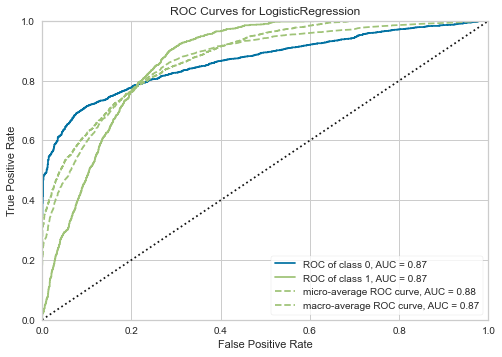

In [28]:
plot_model(best)


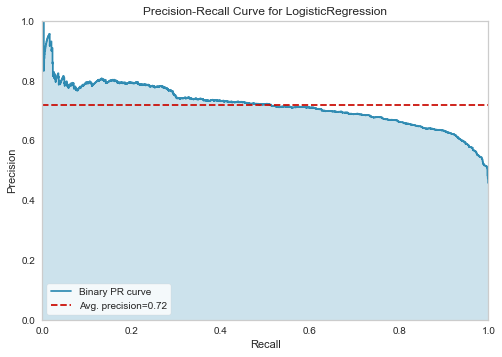

In [29]:
plot_model(best, plot='pr')


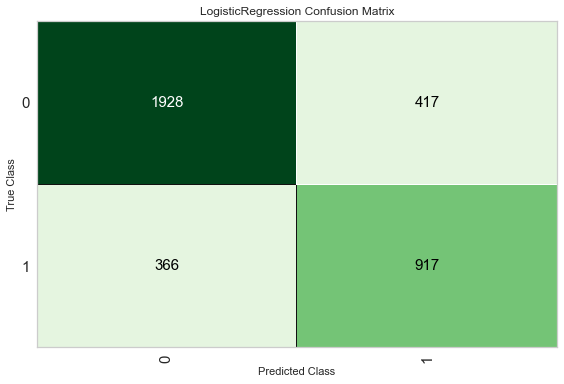

In [30]:
plot_model(best, plot='confusion_matrix')


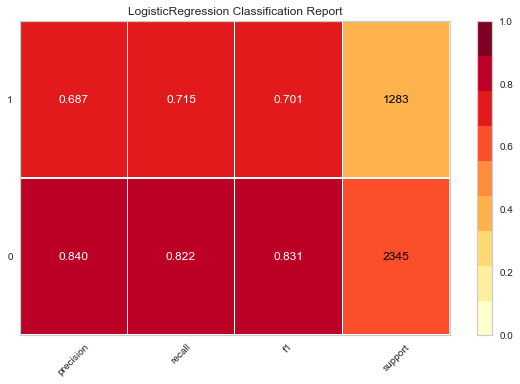

In [31]:
plot_model(best, plot='class_report')


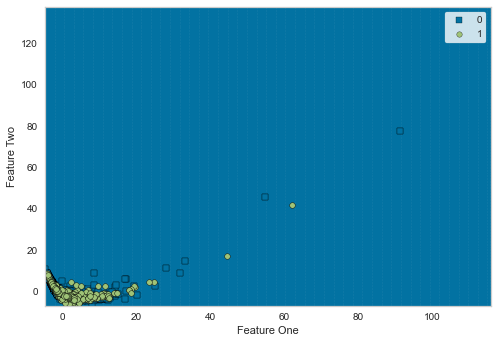

In [32]:
plot_model(best, plot='boundary')


In [33]:
plot_model(best, plot='parameter')


,Parameters
C,1
class_weight,None
dual,False
fit_intercept,True
intercept_scaling,1
l1_ratio,None
max_iter,100
multi_class,auto
n_jobs,None
penalty,l2


Looking further in our catboost tuning parameters that drove our model performance, the output is above. As you can see we employed bootstrapping on 10 estimators with no warm start.


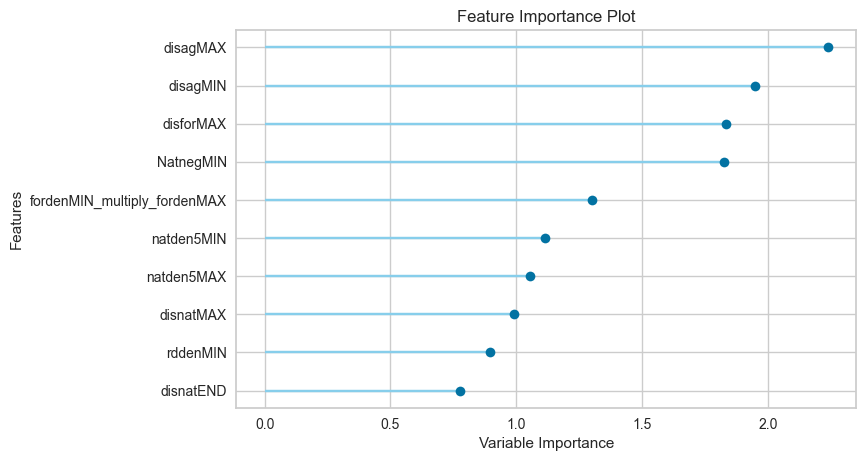

In [37]:
plot_model(best, plot='feature')

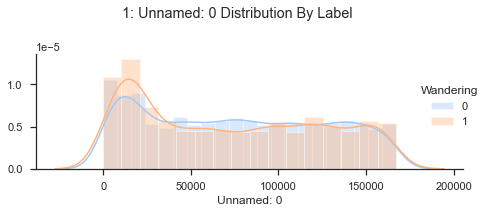

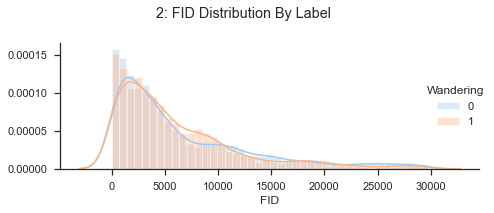

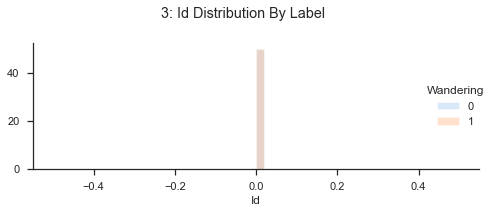

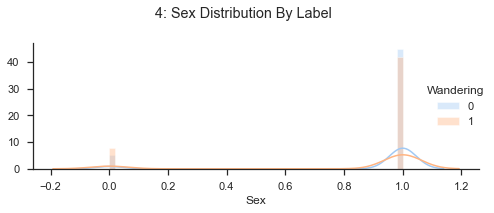

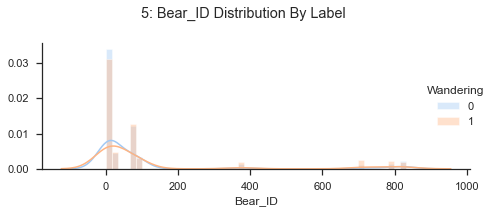

...

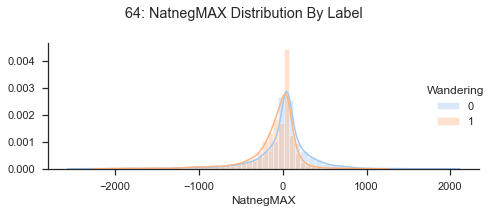

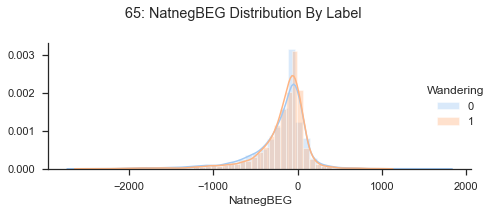

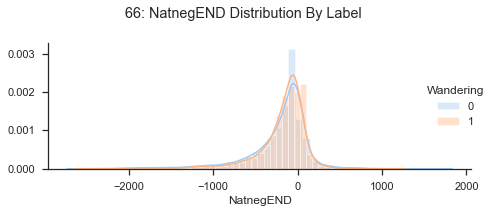

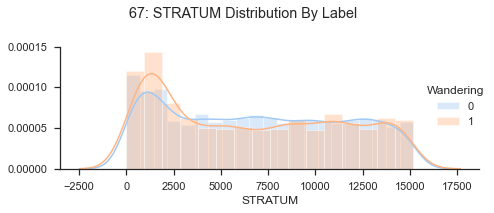

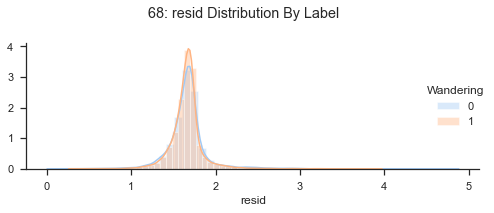

In [39]:

plt.rcParams['figure.max_open_warning']=40
plt.rcParams['figure.figsize']=(5,5)
colnames=list(bothclean.drop(['Wandering'], axis=1).select_dtypes(exclude='O').columns.values)
for i in colnames[0:]:
    facet = sns.FacetGrid(bothclean, hue='Wandering',aspect=2)
    facet.map(sns.distplot,i)
    facet.add_legend()
    facet.fig.suptitle(''.join(map(str, list([colnames.index(i)+1,": ",i," Distribution By Label"]))))
    plt.tight_layout()
    plt.show()

Key differentiators
- datetime
- month
- disagmax/ disagmin
- disfor max
- diswatMIN

In [21]:
# Import all necessary libraries we will be using in our dataset

import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import math
import re
import sklearn
import statistics
import random

from sklearn.feature_selection import SelectKBest, chi2, SelectPercentile, RFE, SelectFromModel

from sklearn.preprocessing import StandardScaler, Binarizer

from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.svm import SVC, LinearSVC

from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, auc, roc_curve
from IPython.display import display, HTML

from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, TimeSeriesSplit, StratifiedShuffleSplit

from sklearn.naive_bayes import MultinomialNB

from sklearn.ensemble import GradientBoostingClassifier,GradientBoostingRegressor,AdaBoostClassifier,RandomForestClassifier, BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics


%matplotlib inline

matplotlib.style.use('ggplot')

import warnings
warnings.filterwarnings('ignore')
print(bothclean.shape)


(17277, 69)


In [22]:
bothclean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17277 entries, 0 to 17276
Data columns (total 69 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  17277 non-null  int64  
 1   FID         17277 non-null  int64  
 2   Id          17277 non-null  int64  
 3   Sex         17277 non-null  int64  
 4   Bear_ID     17277 non-null  int64  
 5   SAMPLEID    17277 non-null  int64  
 6   BEARING     17277 non-null  float64
 7   OBSERVED    17277 non-null  int64  
 8   datetime    17277 non-null  float64
 9   month       17277 non-null  int64  
 10  CLUSTER     17277 non-null  int64  
 11  disagLWM    17277 non-null  float64
 12  disagMIN    17277 non-null  float64
 13  disagMAX    17277 non-null  float64
 14  disagBEG    17277 non-null  float64
 15  disagEND    17277 non-null  float64
 16  disforLWM   17277 non-null  float64
 17  disforMIN   17277 non-null  float64
 18  disforMAX   17277 non-null  float64
 19  disforBEG   17277 non-nul

In [23]:
%%time
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
import numpy as np
from sklearn import metrics as mt

cv = StratifiedKFold(n_splits=10)

features = ['BEARING', 'datetime', 'month', 
       'disagLWM', 'disagMIN', 'disagMAX', 'disagBEG', 'disagEND', 'disforLWM',
       'disforMIN', 'disforMAX', 'disforBEG', 'disforEND', 'disnatLWM',
       'disnatMIN', 'disnatMAX', 'disnatBEG', 'disnatEND', 'distrdsLWM',
       'distrdsMIN', 'distrdsMAX', 'distrdsBEG', 'distrdsEND', 'distwatLWM',
       'distwatMIN', 'distwatMAX', 'distwatBEG', 'distwatEND', 'natden5LWM',
       'natden5MIN', 'natden5MAX', 'natden5BEG', 'natden5END', 'fordenLWM',
       'fordenMIN', 'fordenMAX', 'fordenBEG', 'fordenEND', 'rddenLWM',
       'rddenMIN', 'rddenMAX', 'rddenBEG', 'rddenEND', 'forestLWM',
       'forestMIN', 'forestMAX', 'forestBEG', 'forestEND', 'naturalLWM',
       'naturalMIN', 'naturalMAX', 'naturalBEG', 'naturalEND', 'NatnegLWM',
       'NatnegMIN', 'NatnegMAX', 'NatnegBEG', 'NatnegEND']

X2 = bothclean[features].copy()

scaler = StandardScaler()
scaler.fit(X2)

#This makes our model's coefficients take on the same scale for accurate feature importance analysis
#Notice we scaled the data before the cross validation
X = scaler.transform(X2)

Y= bothclean[['Wandering']].copy()


CPU times: user 31.4 ms, sys: 13.6 ms, total: 45 ms
Wall time: 45.8 ms


In [24]:

from sklearn import metrics as mt

# train and test split before resampling
X1_train, X1_test, y1_train, y1_test = train_test_split(X, Y, test_size = 0.2, random_state = 101)

In [25]:
#print("Before OverSampling, counts of label 'Observed': {}".format(sum(y1_train['OBSERVED'] == "1")))
#print("Before OverSampling, counts of label 'Random': {} \n".format(sum(y1_train['OBSERVED'] == "0"))) 

# import SMOTE module from imblearn library 
# pip install imblearn (if you don't have imblearn in your system) 
from imblearn.over_sampling import SMOTE 
sm = SMOTE(random_state = 2) 
X1_train_res, y1_train_res = sm.fit_sample(X1_train, y1_train.values.ravel()) 
  
print('After OverSampling, the shape of train_X: {}'.format(X1_train_res.shape)) 
print('After OverSampling, the shape of train_y: {} \n'.format(y1_train_res.shape))

After OverSampling, the shape of train_X: (17892, 58)
After OverSampling, the shape of train_y: (17892,) 



In [26]:

X2.columns
X1DF = pd.DataFrame(X1_train_res, columns =X2.columns)

In [27]:
print(y1_train_res.shape)
ydf = pd.DataFrame(y1_train_res)

(17892,)


### Dimensionality Reduction -PCA

In [31]:
to_keep=['BEARING', 'datetime', 'month', 
       'disagLWM', 'disagMIN', 'disagMAX', 'disagBEG', 'disagEND', 'disforLWM',
       'disforMIN', 'disforMAX', 'disforBEG', 'disforEND', 'disnatLWM',
       'disnatMIN', 'disnatMAX', 'disnatBEG', 'disnatEND', 'distrdsLWM',
       'distrdsMIN', 'distrdsMAX', 'distrdsBEG', 'distrdsEND', 'distwatLWM',
       'distwatMIN', 'distwatMAX', 'distwatBEG', 'distwatEND', 'natden5LWM',
       'natden5MIN', 'natden5MAX', 'natden5BEG', 'natden5END', 'fordenLWM',
       'fordenMIN', 'fordenMAX', 'fordenBEG', 'fordenEND', 'rddenLWM',
       'rddenMIN', 'rddenMAX', 'rddenBEG', 'rddenEND', 'forestLWM',
       'forestMIN', 'forestMAX', 'forestBEG', 'forestEND', 'naturalLWM',
       'naturalMIN', 'naturalMAX', 'naturalBEG', 'naturalEND', 'NatnegLWM',
       'NatnegMIN', 'NatnegMAX', 'NatnegBEG', 'NatnegEND']
bothclean2=X1DF[to_keep]
bothclean2.columns.values
from sklearn.decomposition import PCA 
pca = PCA(3)  
projected = pca.fit_transform(bothclean)
print(X1DF.shape)
print(projected.shape)

(17892, 58)
(17277, 3)


In [32]:
from sklearn.decomposition import PCA 
pcax = PCA(3)  
projected = pcax.fit_transform(bothclean2)
pcax.explained_variance_ratio_

array([0.31191377, 0.12755291, 0.09024536])

In [33]:

X_train_pcadf=pd.DataFrame(projected)
X_train_pcadf.columns=['First Component','Second Component', 'Third Component']

pcaydf = X_train_pcadf.merge(ydf, left_index=True, right_index=True)

In [34]:
pcaydf = pcaydf.rename(columns={0: 'Wandering'})


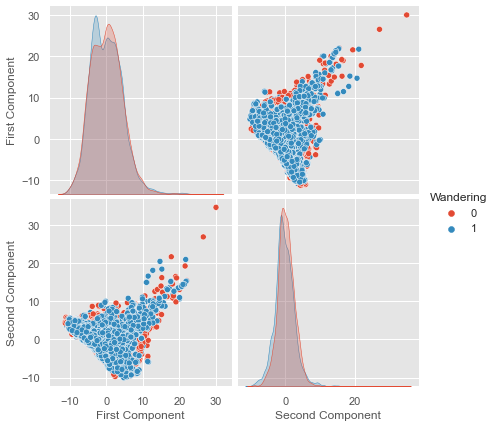

In [35]:
import seaborn as sns
sns.pairplot(pcaydf, height=3, hue= 'Wandering', vars = ['First Component', 'Second Component'])

In [36]:
X1P = pcaydf['First Component']
Y1P = pcaydf['Second Component'] 
Z1P = pcaydf['Third Component']
L1P = pcaydf['Wandering'].astype(int)

Text(0.5, 0.92, 'PCA data exploration')

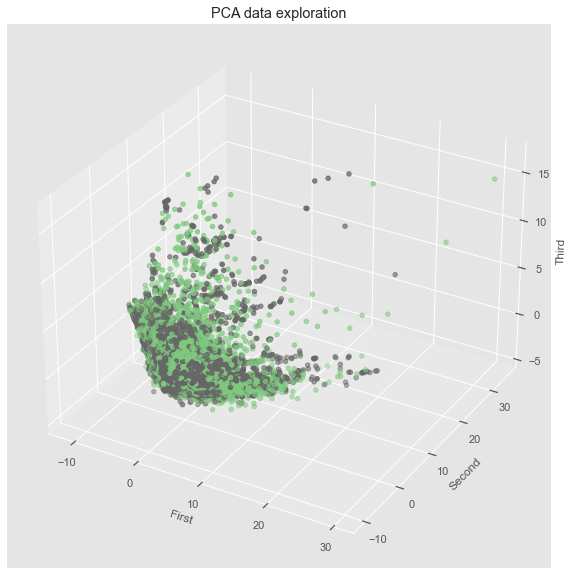

In [37]:

plt.rcParams["figure.figsize"] = (20,10)
ax = plt.axes(projection='3d')
ax.scatter(X1P, Y1P, Z1P, c=L1P, cmap='Accent', linewidth=1)

ax.set_xlabel('First')
ax.set_ylabel('Second')
ax.set_zlabel('Third')
plt.title('PCA data exploration')

# Clustering with PCA

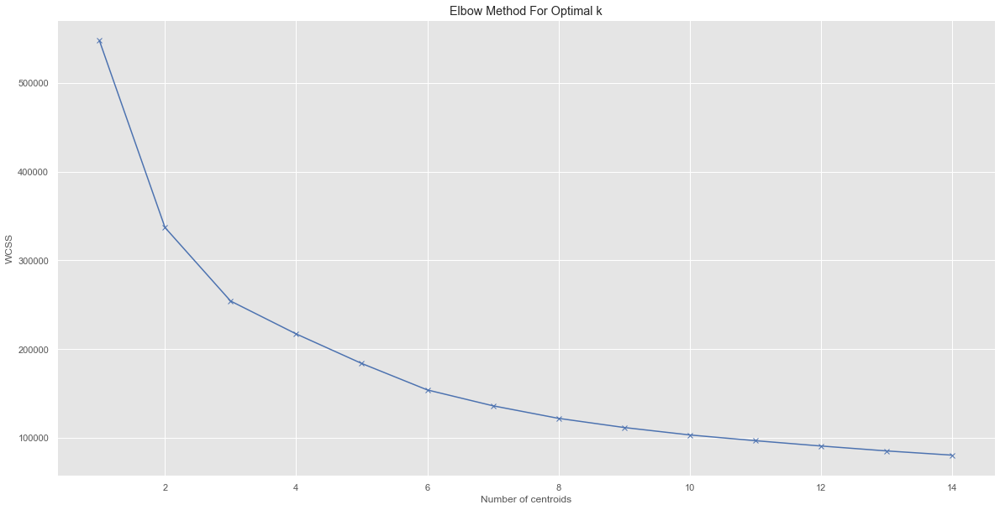

In [38]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
wcss = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(projected)
    wcss.append(km.inertia_)
plt.plot(K, wcss, 'bx-')
plt.xlabel('Number of centroids')
plt.ylabel('WCSS')
plt.title('Elbow Method For Optimal k')
plt.show()

In [48]:
from sklearn.cluster import KMeans

#converting our projected array to pandas df
pca=pd.DataFrame(projected)
pca.columns=['First Component','Second Component', 'Third Component']
#build our algorithm with k=2, train it on pca and make predictions

## ________________________________ Assign Clusters _________________

kmeansx = KMeans(n_clusters=2, init='k-means++', random_state=0)

## ________________________________ Assign Clusters _________________

kmeansx.fit(pca)
y_kmeans = kmeansx.predict(pca)
newfeature = kmeansx.labels_


X1CV = np.column_stack((pca,pd.get_dummies(newfeature)))
#plotting the results 
#plt.scatter(pca['First Component'], pca['Second Component'], c=y_kmeans, s=50, alpha=0.5,cmap='viridis')
centers = kmeansx.cluster_centers_
#plt.scatter(centers[:, 0], centers[:, 1], c='red', s=50)
#plt.scatter(centers[:, 0], centers[:, 1], c='red', s=50)

In [49]:
centers


array([[ 3.3861763 , -0.40734127,  0.14141525],
       [-3.42117947,  0.41155199, -0.14287707]])

In [50]:
X1P = pcaydf['First Component']
Y1P = pcaydf['Second Component'] 
Z1P = pcaydf['Third Component']
L1P = y_kmeans

Text(0.5, 0.92, 'PCA Clustering with basic Kmeans')

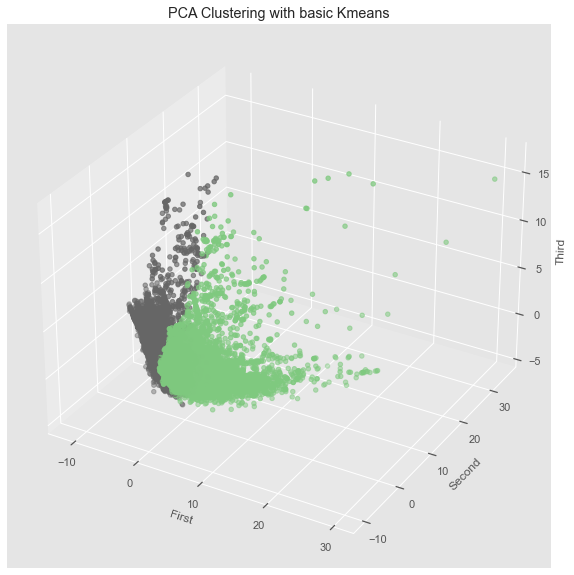

In [51]:
plt.rcParams["figure.figsize"] = (20,10)
ax = plt.axes(projection='3d')
ax.scatter(X1P, Y1P, Z1P, c=L1P, cmap='Accent', linewidth=1)

ax.set_xlabel('First')
ax.set_ylabel('Second')
ax.set_zlabel('Third')
plt.title('PCA Clustering with basic Kmeans')

In [52]:
from sklearn.metrics import silhouette_score

# Get silhouette score
knnb_sil = silhouette_score(pcaydf, L1P, random_state=123456789)
print("Average KNN Silhouette Score:", knnb_sil)

Average KNN Silhouette Score: 0.3579216417841142


In [53]:
#converting our projected array to pandas df
pca=pd.DataFrame(projected)
pca.columns=['First Component','Second Component', 'Third Component']
#pca = pca.drop('Third Component', axis=1)
pca


,First Component,Second Component,Third Component
0,0.411828,-0.544409,0.060132
1,4.044946,0.176512,-0.615982
2,0.029187,-0.376275,0.861677
3,0.462700,-1.316018,-0.309558
4,-3.718170,0.462034,-2.033682
...,...,...,...
17887,7.728075,-1.163650,0.888816
17888,2.285553,-0.795504,-0.674238
17889,-2.171229,-2.714935,-1.172464
17890,3.951863,-5.855128,1.667250


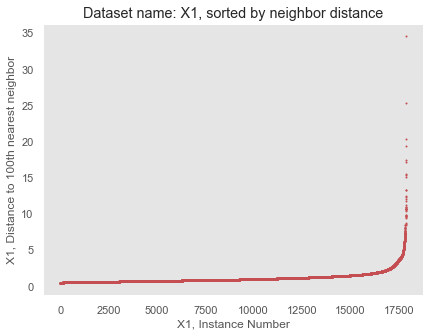

In [54]:

# lets first look at the connectivity of the graphs and distance to the nearest neighbors
from sklearn.neighbors import kneighbors_graph

#=======================================================
# CHANGE THESE VALUES TO ADJUST MINPTS FOR EACH DATASET
X1_N = 100
#=======================================================

# create connectivity graphs before calcualting the hierarchy
X1_knn_graph = kneighbors_graph(pca.values, X1_N, mode='distance') # calculate distance to four nearest neighbors


N1 = X1_knn_graph.shape[0]
X1_4nn_distances = np.zeros((N1,1))
for i in range(N1):
    X1_4nn_distances[i] = X1_knn_graph[i,:].max()

X1_4nn_distances = np.sort(X1_4nn_distances, axis=0)


plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(range(N1), X1_4nn_distances, 'r.', markersize=2) #plot the data
plt.title('Dataset name: X1, sorted by neighbor distance')
plt.xlabel('X1, Instance Number')
plt.ylabel('X1, Distance to {0}th nearest neighbor'.format(X1_N))
plt.grid()

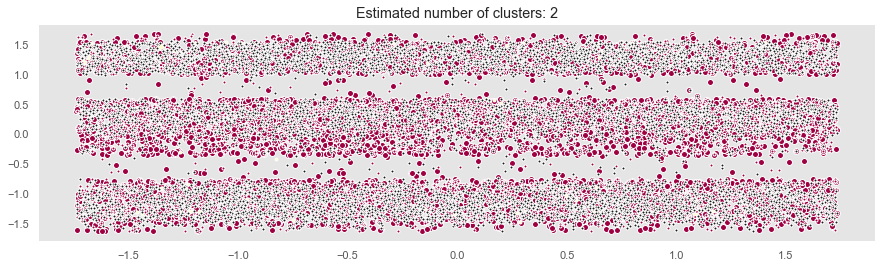

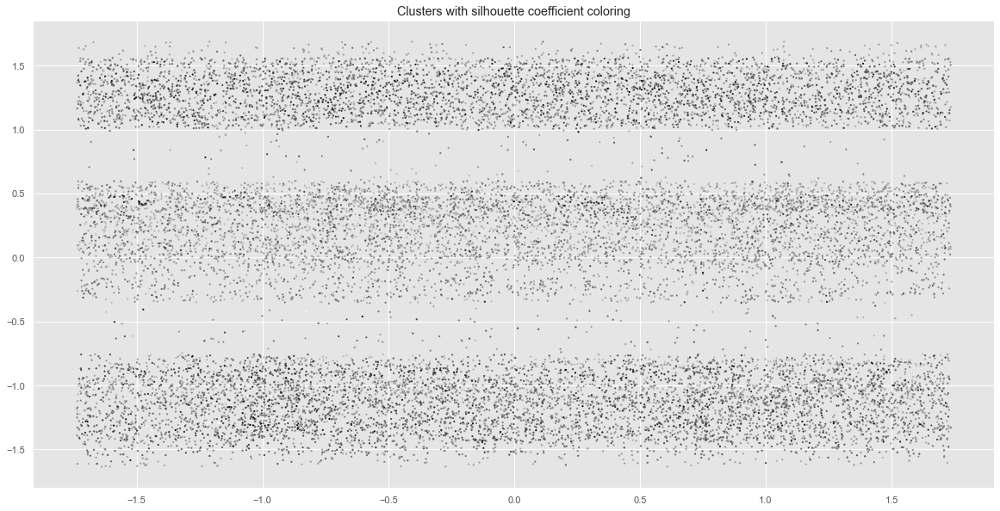

CPU times: user 7.29 s, sys: 2.64 s, total: 9.92 s
Wall time: 5.68 s


In [55]:
%%time 

from sklearn.cluster import DBSCAN

#=====================================
# ENTER YOUR CODE HERE TO CHANGE MINPTS AND EPS FOR EACH DATASET
X1_minpts = X1_N # from above
X1_eps = .8
#=====================================

db = DBSCAN(eps=X1_eps, min_samples=X1_minpts).fit(pca)
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

# mark the samples that are considered "core"
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True

plt.figure(figsize=(15,4))
unique_labels = set(labels) # the unique labels
colors = plt.cm.Spectral(np.linspace(0, 1, len(unique_labels)))
for k, col in zip(unique_labels, colors):
        if k == -1:
            # Black used for noise.
            col = 'k'

        class_member_mask = (labels == k)

        xy = X1_train_res[class_member_mask & core_samples_mask]
        # plot the core points in this class
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=col,
                 markeredgecolor='w', markersize=6)

        # plot the remaining points that are edge points
        xy = X1_train_res[class_member_mask & ~core_samples_mask]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=col,
                 markeredgecolor='w', markersize=3)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.grid()
plt.show()

silhouette_per_sample = metrics.silhouette_samples(X1_train_res, labels)

plt.figure()
plt.scatter(X1_train_res[:, 0], X1_train_res[:, 1], c=silhouette_per_sample,
                cmap=plt.cm.gray, s=5, linewidths=0)
plt.title('Clusters with silhouette coefficient coloring')
plt.show()

In [56]:
X1P = pcaydf['First Component']
Y1P = pcaydf['Second Component'] 
Z1P = pcaydf['Third Component']
L1P = labels

Text(0.5, 0.92, 'PCA Clustering with basic DBSCAN')

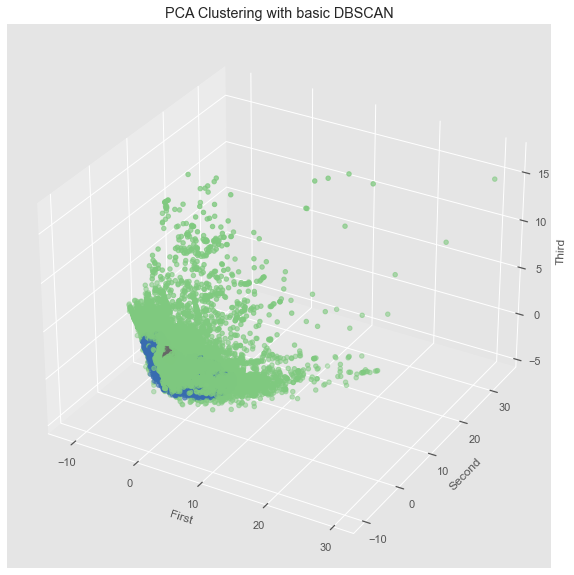

In [57]:

plt.rcParams["figure.figsize"] = (20,10)
ax = plt.axes(projection='3d')
ax.scatter(X1P, Y1P, Z1P, c=L1P, cmap='Accent', linewidth=1)

ax.set_xlabel('First')
ax.set_ylabel('Second')
ax.set_zlabel('Third')
plt.title('PCA Clustering with basic DBSCAN')

In [58]:
from sklearn.metrics import silhouette_score

# Get silhouette score
dbscansil = silhouette_score(pcaydf, L1P, random_state=123456789)
print("Average DBSCAN Silhouette Score:", dbscansil)

Average DBSCAN Silhouette Score: 0.03175596849606223


In [59]:

from sklearn import metrics

print('Estimated number of clusters: %d' % n_clusters_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(y1_train_res, labels))
print("Completeness: %0.3f" % metrics.completeness_score(y1_train_res, labels))
print("V-measure: %0.3f" % metrics.v_measure_score(y1_train_res, labels))
print("Adjusted Rand Index: %0.3f"
      % metrics.adjusted_rand_score(y1_train_res, labels))
print("Adjusted Mutual Information: %0.3f"
      % metrics.adjusted_mutual_info_score(y1_train_res, labels, average_method='arithmetic'))
#print("Silhouette Coefficient: %0.3f"
     # % metrics.silhouette_score(y1_train_res, labels))

Estimated number of clusters: 2
Homogeneity: 0.002
Completeness: 0.002
V-measure: 0.002
Adjusted Rand Index: 0.001
Adjusted Mutual Information: 0.002


In [60]:
#pca=pd.DataFrame(projected)
pca.columns=['First Component','Second Component', 'Third Component']
#pcasubset=pca.sample(n=30000)

# Advance Clustering - Kmeans

In [62]:
# Set up results matrix
df_kms_result = pd.DataFrame(
{'Configuration':['Config 1','Config 2','Config 3','Config 4','Config 5','Config 6'],
'SilhouetteScore':[None,None,None,None,None,None],
'RelativeTime':[None,None,None,None,None,None]})

In [63]:
%%time
# config 1

from sklearn.cluster import KMeans
from sklearn.model_selection import StratifiedKFold, cross_val_score, ShuffleSplit

# Fit 7 clusters
kms = KMeans(n_clusters=7, init='k-means++',random_state=1, n_init=5, tol=.0001)
kms_X = X1DF
kmsfit = kms.fit(kms_X)
kms_clusters = kms.predict(kms_X)
kms_clusters

df_kms_result.loc[0, 'RelativeTime'] = 'Medium'

CPU times: user 1.46 s, sys: 293 ms, total: 1.75 s
Wall time: 332 ms


In [64]:
%%time
# config 2

from sklearn.cluster import KMeans

# Fit 7 clusters
kms2 = KMeans(n_clusters=7, init='random', random_state=1, n_init=5, tol=.0001)
kms_X = X1DF
kms2fit = kms2.fit(kms_X)
kms_clusters2 = kms2.predict(kms_X)
kms_clusters2
df_kms_result.loc[1, 'RelativeTime'] = 'Medium High'

CPU times: user 1.57 s, sys: 136 ms, total: 1.71 s
Wall time: 337 ms


In [65]:
%%time
# config 3

from sklearn.cluster import KMeans

# Fit 7 clusters
kms3 = KMeans(n_clusters=7, init='k-means++', random_state=1, n_init=1, tol=.0001)
kms_X = X1DF
kms3fit = kms3.fit(kms_X)
kms_clusters3 = kms3.predict(kms_X)
kms_clusters3
df_kms_result.loc[2, 'RelativeTime'] = 'Very Short'

CPU times: user 383 ms, sys: 63 ms, total: 447 ms
Wall time: 111 ms


In [66]:
%%time
# config 4

from sklearn.cluster import KMeans

# Fit 7 clusters
kms4 = KMeans(n_clusters=7, init='random', random_state=1, n_init=1, tol=.0001)
kms_X = X1DF
kms4fit = kms4.fit(kms_X)
kms_clusters4 = kms4.predict(kms_X)
kms_clusters4
df_kms_result.loc[3, 'RelativeTime'] = 'Short'

CPU times: user 167 ms, sys: 18.4 ms, total: 185 ms
Wall time: 59.2 ms


In [67]:
labels2df = pd.DataFrame(kms_clusters4, columns = ["Cluster_Label"])


In [69]:
knnmergedf = bothclean.merge(labels2df, left_index=True, right_index=True)


In [71]:
#pip install google.colab

     |████████████████████████████████| 72 kB 264 kB/s eta 0:00:01
     |████████████████████████████████| 64 kB 265 kB/s eta 0:00:01
     |████████████████████████████████| 104 kB 374 kB/s eta 0:00:01
     |████████████████████████████████| 758 kB 672 kB/s eta 0:00:01
     |████████████████████████████████| 8.0 MB 2.0 MB/s eta 0:00:01     |████████████████████████▌       | 6.2 MB 916 kB/s eta 0:00:03
     |████████████████████████████████| 11.8 MB 2.4 MB/s eta 0:00:01
     |████████████████████████████████| 57 kB 14.1 MB/s eta 0:00:01
     |████████████████████████████████| 484 kB 3.2 MB/s eta 0:00:01
     |████████████████████████████████| 155 kB 969 kB/s eta 0:00:01
     |████████████████████████████████| 47 kB 1.3 MB/s eta 0:00:01
     |████████████████████████████████| 245 kB 945 kB/s eta 0:00:01
     |████████████████████████████████| 58 kB 849 kB/s eta 0:00:01
     |████████████████████████████████| 118 kB 1.3 MB/s eta 0:00:01
     |████████████████████████████████| 77 kB 1.0 MB

  Created wheel for google.colab: filename=google_colab-1.0.0-py2.py3-none-any.whl size=102290 sha256=470759a8e079e03735dd0a3de6ff323f81ceb02247b4c28566779cc49598db91
  Stored in directory: /Users/daniel.clark/Library/Caches/pip/wheels/e4/e7/91/b2736701bca00e273fdc79f80e2727b558e0903d81b758eb69
  ERROR: Command errored out with exit status 1:
   command: /usr/local/Cellar/jupyterlab/2.2.8/libexec/bin/python3.8 -u -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'/private/var/folders/rg/snshky_11wg8qk4y4fwnrhr40000gn/T/pip-install-tkiho4th/pandas/setup.py'"'"'; __file__='"'"'/private/var/folders/rg/snshky_11wg8qk4y4fwnrhr40000gn/T/pip-install-tkiho4th/pandas/setup.py'"'"';f=getattr(tokenize, '"'"'open'"'"', open)(__file__);code=f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' bdist_wheel -d /private/var/folders/rg/snshky_11wg8qk4y4fwnrhr40000gn/T/pip-wheel-8g5bpgtw
       cwd: /private/var/folders/rg/snshky_11wg8qk4y4fwnrhr40

  ERROR: Failed building wheel for pandas
  Running setup.py clean for pandas
  Created wheel for portpicker: filename=portpicker-1.2.0-py3-none-any.whl size=13371 sha256=88b9a261741542fcdb53586c430792f450d993755addffc9a06221c0a2169403
  Stored in directory: /Users/daniel.clark/Library/Caches/pip/wheels/b9/10/77/cad2fb4f8ab57cc7cecb92b9b1b0548ac932b8f81774003683
  Created wheel for tornado: filename=tornado-4.5.3-cp38-cp38-macosx_10_15_x86_64.whl size=422375 sha256=2a6928b71469def77bbe18fae95b9a0f7d88af67783ce89165af1069aebf4543
  Stored in directory: /Users/daniel.clark/Library/Caches/pip/wheels/20/fe/26/0c03adccd0cec2744261ec6b8380fbe5e726d1ea4cf3a9370e
  Created wheel for simplegeneric: filename=simplegeneric-0.8.1-py3-none-any.whl size=5074 sha256=91b2402a1726010907c392c678254b19a88d601a1a53415a400cdd93735e7b6e
  Stored in directory: /Users/daniel.clark/Library/Caches/pip/wheels/0b/32/6b/5f5447909a062da20dfe432fa945d8f98636692637deccaa8a
Successfully built google.colab portpicker t

You should consider upgrading via the '/usr/local/Cellar/jupyterlab/2.2.8/libexec/bin/python3.8 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [74]:
#from google.colab import drive
#drive.mount('/content/drive/')
#knnmergedf.to_csv("/content/drive/My Drive/Colab Notebooks/knnmergedf.csv")

In [75]:
%%time
# config 5

from sklearn.cluster import KMeans

# Fit 7 clusters
kms5 = KMeans(n_clusters=7, init='random', random_state=1, n_init=1, tol=.1)
kms_X = X1DF
kms5fit = kms5.fit(kms_X)
kms_clusters5 = kms5.predict(kms_X)
kms_clusters5
df_kms_result.loc[4, 'RelativeTime'] = 'Very Short'

CPU times: user 156 ms, sys: 27.5 ms, total: 184 ms
Wall time: 74.7 ms


In [76]:
%%time
# config 6

from sklearn.cluster import KMeans

# Fit 7 clusters
kms6 = KMeans(n_clusters=7, init='random', random_state=1, n_init=1, tol=.0000001)
kms_X = X1DF
kms6fit = kms6.fit(kms_X)
kms_clusters6 = kms6.predict(kms_X)
kms_clusters6
df_kms_result.loc[5, 'RelativeTime'] = 'Medium Low'

CPU times: user 170 ms, sys: 19.2 ms, total: 189 ms
Wall time: 63.3 ms


In [77]:
# config 1
from sklearn.metrics import silhouette_score
from time import time
import numpy as np
import matplotlib.pyplot as plt

from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.datasets import load_digits
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

from sklearn.metrics.cluster import homogeneity_score


# Get silhouette score
kms_sil = silhouette_score(kms_X, kms_clusters, random_state=1)
print("Average K-means Silhouette Score:", kms_sil)
df_kms_result.loc[0, 'SilhouetteScore'] = kms_sil



print("Homogeneity: %0.3f" % metrics.homogeneity_score(y1_train_res, kmsfit.labels_))
print("Completeness: %0.3f" % metrics.completeness_score(y1_train_res, kmsfit.labels_))
print("V-measure: %0.3f" % metrics.v_measure_score(y1_train_res, kmsfit.labels_))
print("Adjusted Rand Index: %0.3f"
      % metrics.adjusted_rand_score(y1_train_res, kmsfit.labels_))
print("Adjusted Mutual Information: %0.3f"
      % metrics.adjusted_mutual_info_score(y1_train_res, kmsfit.labels_, average_method='arithmetic'))

Average K-means Silhouette Score: 0.14378138810287105
Homogeneity: 0.018
Completeness: 0.008
V-measure: 0.011
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.010


In [78]:
# config 2
from sklearn.metrics import silhouette_score

# Get silhouette score
kms2_sil = silhouette_score(kms_X, kms_clusters2, random_state=1)
print("Average K-means Silhouette Score:", kms2_sil)
df_kms_result.loc[1, 'SilhouetteScore'] = kms2_sil

print("Homogeneity: %0.3f" % metrics.homogeneity_score(y1_train_res, kms2fit.labels_))
print("Completeness: %0.3f" % metrics.completeness_score(y1_train_res, kms2fit.labels_))
print("V-measure: %0.3f" % metrics.v_measure_score(y1_train_res, kms2fit.labels_))
print("Adjusted Rand Index: %0.3f"
      % metrics.adjusted_rand_score(y1_train_res, kms2fit.labels_))
print("Adjusted Mutual Information: %0.3f"
      % metrics.adjusted_mutual_info_score(y1_train_res, kms2fit.labels_, average_method='arithmetic'))

Average K-means Silhouette Score: 0.14378138810287105
Homogeneity: 0.018
Completeness: 0.008
V-measure: 0.011
Adjusted Rand Index: 0.009
Adjusted Mutual Information: 0.010


In [79]:
# config 3
from sklearn.metrics import silhouette_score

# Get silhouette score
kms3_sil = silhouette_score(kms_X, kms_clusters3, random_state=1)
print("Average K-means Silhouette Score:", kms3_sil)
df_kms_result.loc[2, 'SilhouetteScore'] = kms3_sil

print("Homogeneity: %0.3f" % metrics.homogeneity_score(y1_train_res, kms3fit.labels_))
print("Completeness: %0.3f" % metrics.completeness_score(y1_train_res, kms3fit.labels_))
print("V-measure: %0.3f" % metrics.v_measure_score(y1_train_res, kms3fit.labels_))
print("Adjusted Rand Index: %0.3f"
      % metrics.adjusted_rand_score(y1_train_res, kms3fit.labels_))
print("Adjusted Mutual Information: %0.3f"
      % metrics.adjusted_mutual_info_score(y1_train_res, kms3fit.labels_, average_method='arithmetic'))

Average K-means Silhouette Score: 0.14291705712029926
Homogeneity: 0.017
Completeness: 0.007
V-measure: 0.010
Adjusted Rand Index: 0.008
Adjusted Mutual Information: 0.010


In [80]:
# config 4
from sklearn.metrics import silhouette_score

# Get silhouette score
kms4_sil = silhouette_score(kms_X, kms_clusters4, random_state=1)
print("Average K-means Silhouette Score:", kms4_sil)
df_kms_result.loc[3, 'SilhouetteScore'] = kms4_sil

print("Homogeneity: %0.3f" % metrics.homogeneity_score(y1_train_res, kms4fit.labels_))
print("Completeness: %0.3f" % metrics.completeness_score(y1_train_res, kms4fit.labels_))
print("V-measure: %0.3f" % metrics.v_measure_score(y1_train_res, kms4fit.labels_))
print("Adjusted Rand Index: %0.3f"
      % metrics.adjusted_rand_score(y1_train_res, kms4fit.labels_))
print("Adjusted Mutual Information: %0.3f"
      % metrics.adjusted_mutual_info_score(y1_train_res, kms4fit.labels_, average_method='arithmetic'))

Average K-means Silhouette Score: 0.13954610705347265
Homogeneity: 0.011
Completeness: 0.004
V-measure: 0.006
Adjusted Rand Index: 0.005
Adjusted Mutual Information: 0.006


In [81]:
# config 5
from sklearn.metrics import silhouette_score

# Get silhouette score
kms5_sil = silhouette_score(kms_X, kms_clusters5, random_state=1)
print("Average K-means Silhouette Score:", kms5_sil)
df_kms_result.loc[4, 'SilhouetteScore'] = kms5_sil

print("Homogeneity: %0.3f" % metrics.homogeneity_score(y1_train_res, kms5fit.labels_))
print("Completeness: %0.3f" % metrics.completeness_score(y1_train_res, kms5fit.labels_))
print("V-measure: %0.3f" % metrics.v_measure_score(y1_train_res, kms5fit.labels_))
print("Adjusted Rand Index: %0.3f"
      % metrics.adjusted_rand_score(y1_train_res, kms5fit.labels_))
print("Adjusted Mutual Information: %0.3f"
      % metrics.adjusted_mutual_info_score(y1_train_res, kms5fit.labels_, average_method='arithmetic'))

Average K-means Silhouette Score: 0.13961735850342738
Homogeneity: 0.011
Completeness: 0.004
V-measure: 0.006
Adjusted Rand Index: 0.005
Adjusted Mutual Information: 0.006


In [82]:
# config 6
from sklearn.metrics import silhouette_score

# Get silhouette score
kms6_sil = silhouette_score(kms_X, kms_clusters6, random_state=1)
print("Average K-means Silhouette Score:", kms6_sil)
df_kms_result.loc[5, 'SilhouetteScore'] = kms6_sil

print("Homogeneity: %0.3f" % metrics.homogeneity_score(y1_train_res, kms6fit.labels_))
print("Completeness: %0.3f" % metrics.completeness_score(y1_train_res, kms6fit.labels_))
print("V-measure: %0.3f" % metrics.v_measure_score(y1_train_res, kms6fit.labels_))
print("Adjusted Rand Index: %0.3f"
      % metrics.adjusted_rand_score(y1_train_res, kms6fit.labels_))
print("Adjusted Mutual Information: %0.3f"
      % metrics.adjusted_mutual_info_score(y1_train_res, kms6fit.labels_, average_method='arithmetic'))

Average K-means Silhouette Score: 0.13954610705347265
Homogeneity: 0.011
Completeness: 0.004
V-measure: 0.006
Adjusted Rand Index: 0.005
Adjusted Mutual Information: 0.006


In [83]:
df_kms_result


,Configuration,SilhouetteScore,RelativeTime
0,Config 1,0.143781,Medium
1,Config 2,0.143781,Medium High
2,Config 3,0.142917,Very Short
3,Config 4,0.139546,Short
4,Config 5,0.139617,Very Short
5,Config 6,0.139546,Medium Low


In [84]:
%%time
# config 4

from sklearn.cluster import KMeans

# Fit 7 clusters
kms4 = KMeans(n_clusters=7, init='random', random_state=1, n_init=1, tol=.0001)
kms_X = X1DF
kms4fit = kms4.fit(kms_X)
kms_clusters4 = kms4.predict(kms_X)
kms_clusters4
df_kms_result.loc[3, 'RelativeTime'] = 'Short'

CPU times: user 176 ms, sys: 24.8 ms, total: 201 ms
Wall time: 69.8 ms


In [85]:
knn_tbl = pd.DataFrame(columns = [
    'model_name',
    'n_clusters',
    'inertia',
    'silhouette',
    'process_time'])

In [86]:
kms4fit

KMeans(init='random', n_clusters=7, n_init=1, random_state=1)

n_clusters =  2
silhouette =  0.19979772947926808
n_clusters = 2


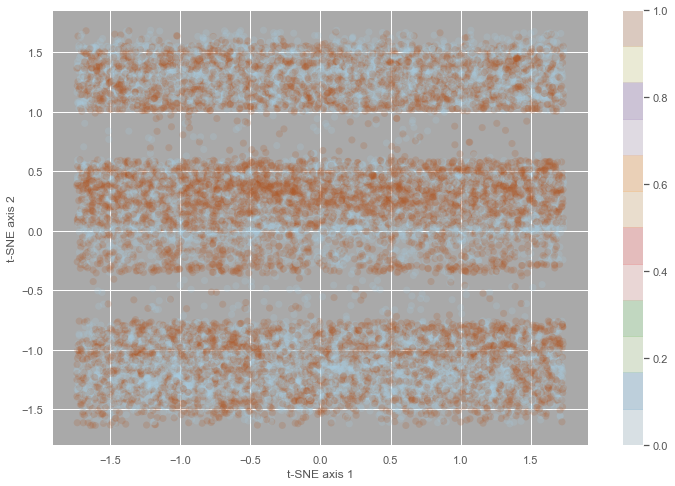

n_clusters =  3
silhouette =  0.18283501572970992
n_clusters = 3


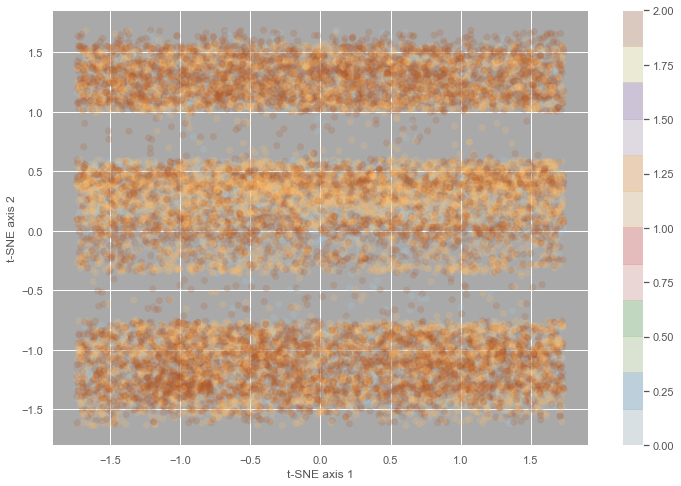

n_clusters =  4
silhouette =  0.17205695826144224
n_clusters = 4


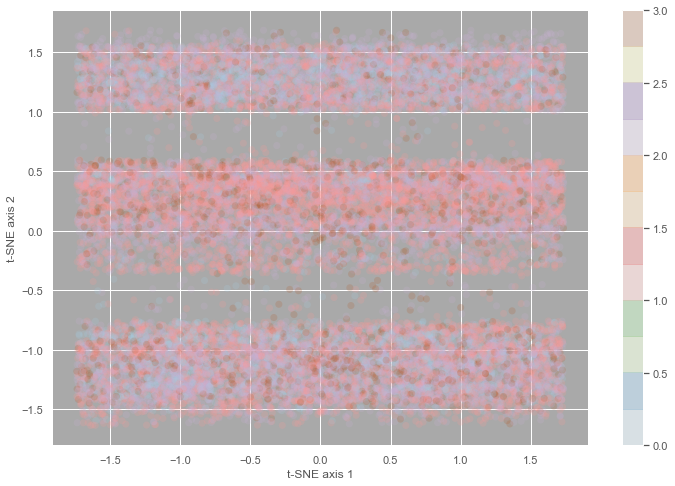

n_clusters =  5
silhouette =  0.1533586944665996
n_clusters = 5


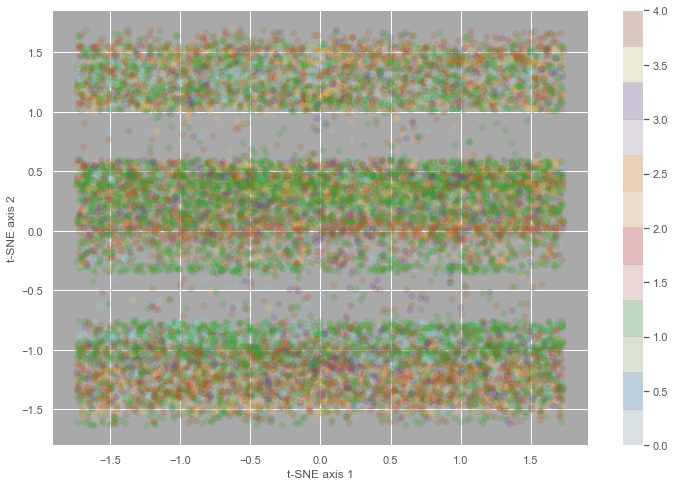

n_clusters =  6
silhouette =  0.13896004191283182
n_clusters = 6


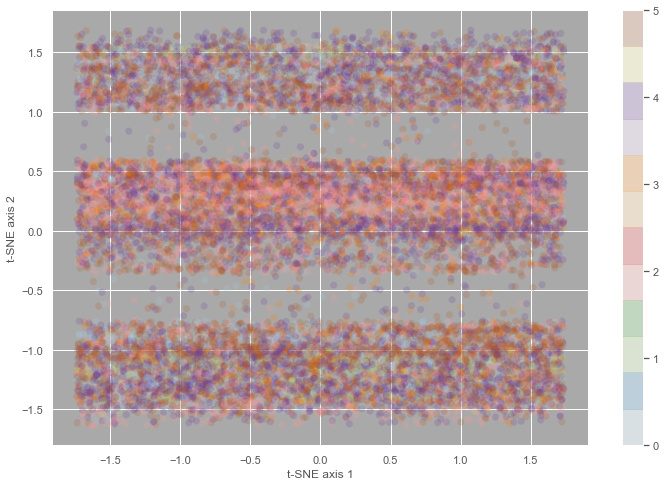

n_clusters =  7
silhouette =  0.13954610705347265
n_clusters = 7


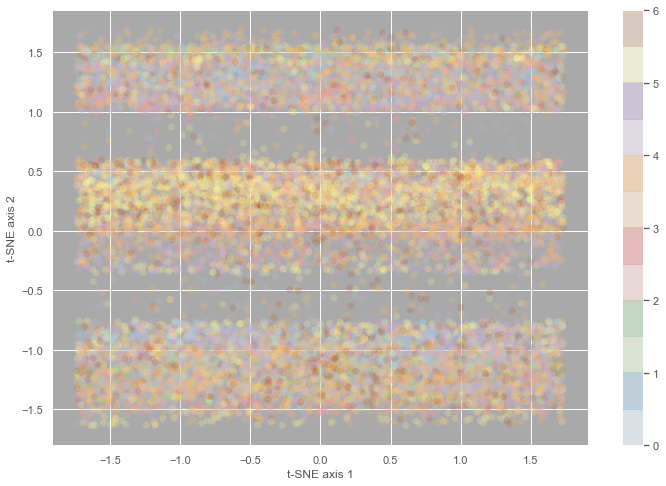

n_clusters =  8
silhouette =  0.12443580732138117
n_clusters = 8


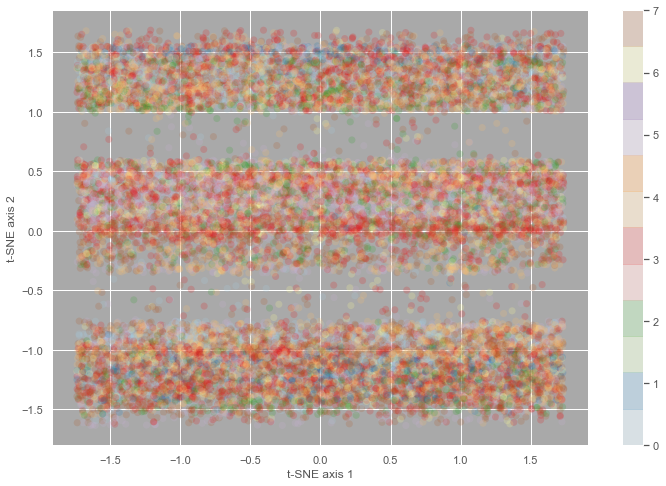

n_clusters =  9
silhouette =  0.13839414049928886
n_clusters = 9


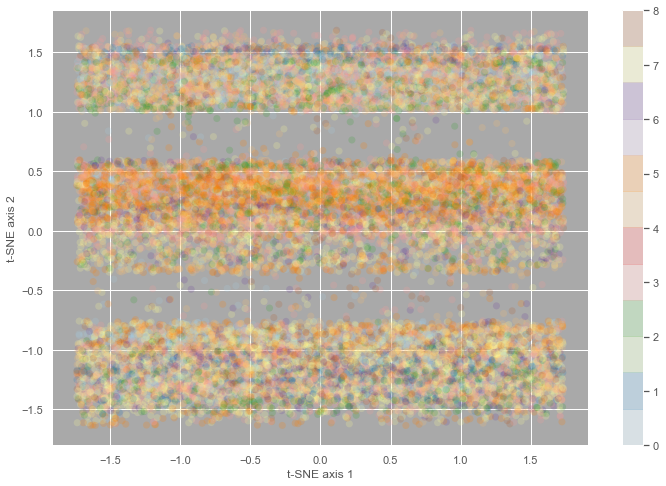

n_clusters =  10
silhouette =  0.13842032925844835
n_clusters = 10


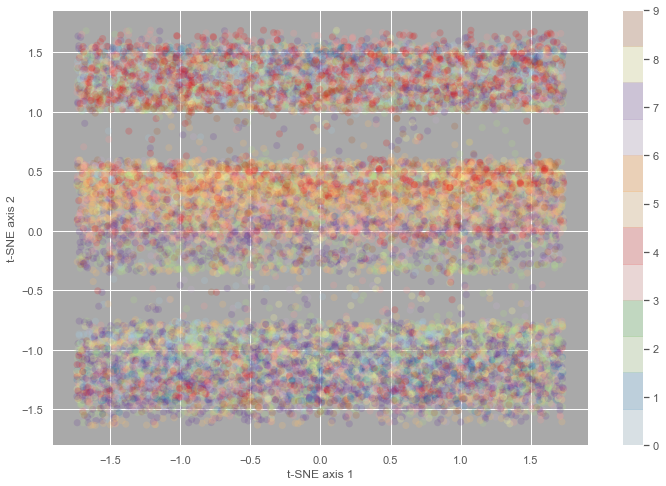

n_clusters =  11
silhouette =  0.124797647816232
n_clusters = 11


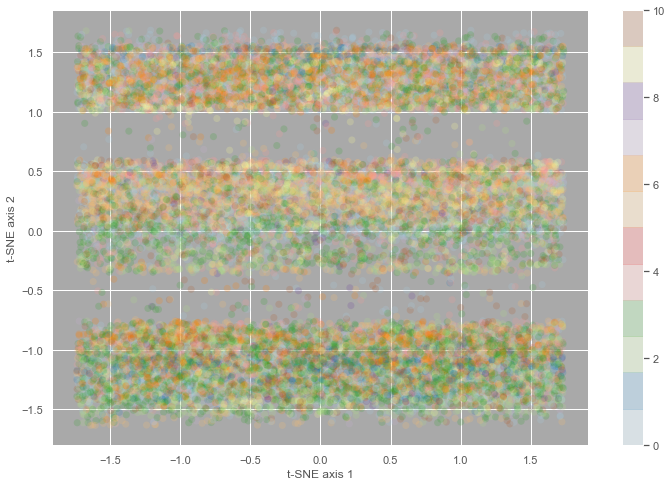

n_clusters =  12
silhouette =  0.14073123115025085
n_clusters = 12


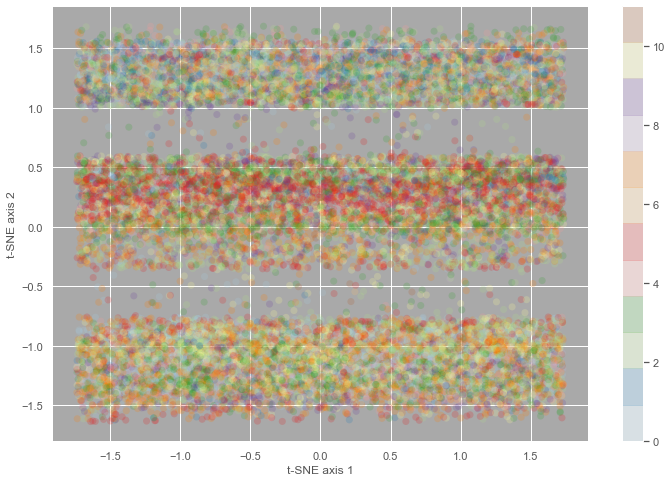

n_clusters =  13
silhouette =  0.1292569202964991
n_clusters = 13


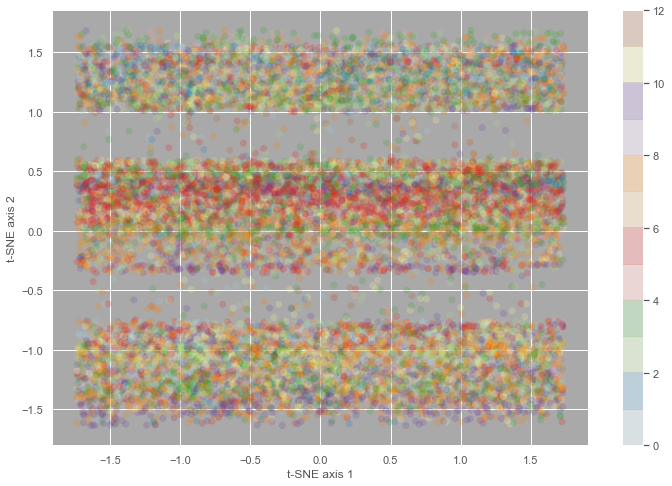

n_clusters =  14
silhouette =  0.13918061040882626
n_clusters = 14


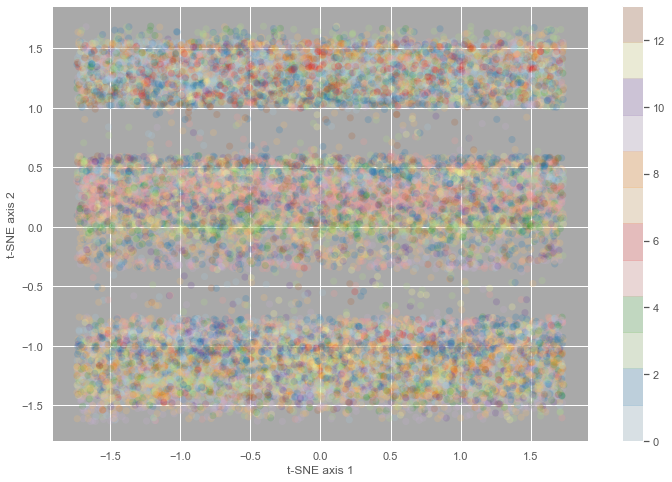

n_clusters =  15
silhouette =  0.12742433285490667
n_clusters = 15


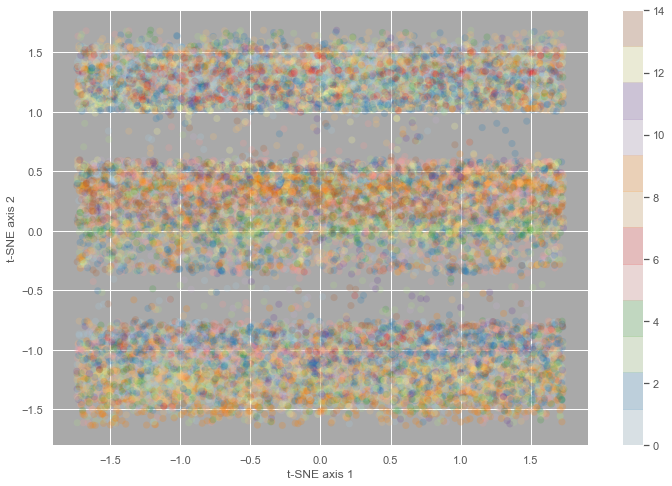

n_clusters =  16
silhouette =  0.11898703732574277
n_clusters = 16


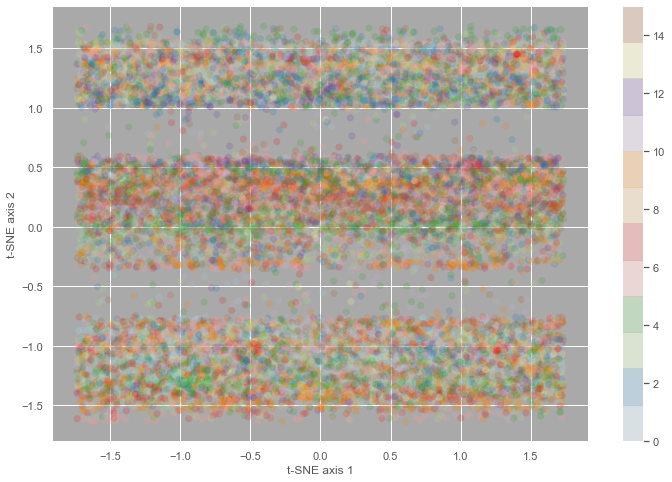

n_clusters =  17
silhouette =  0.12474506505234037
n_clusters = 17


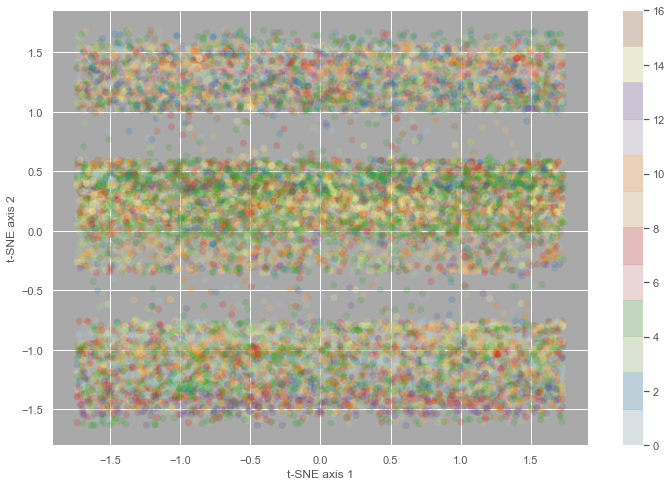

n_clusters =  18
silhouette =  0.12349036916712644
n_clusters = 18


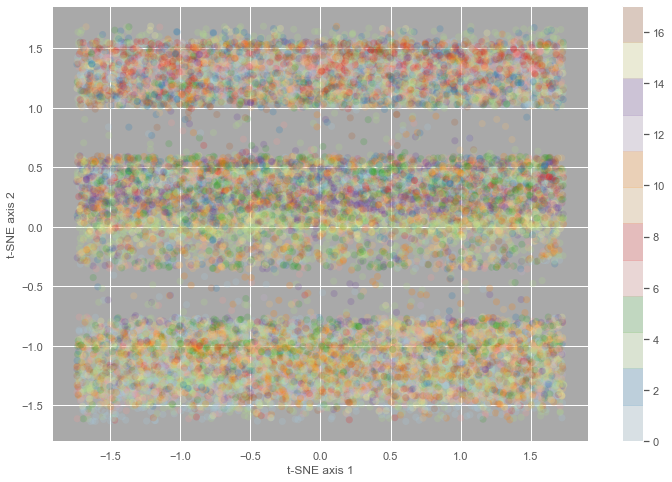

n_clusters =  19
silhouette =  0.12810197460608053
n_clusters = 19


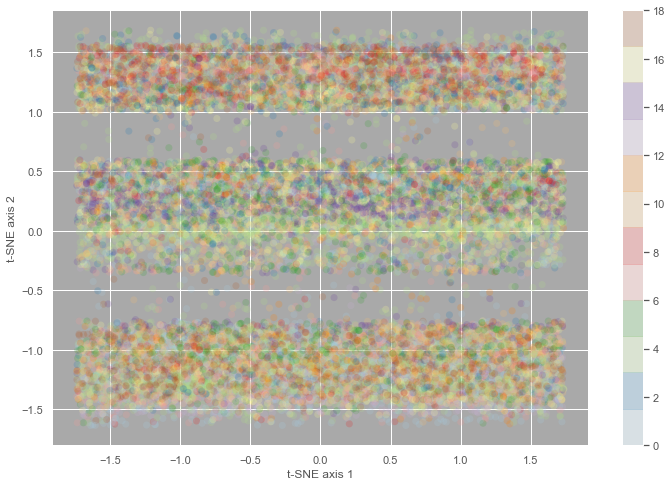

In [92]:
i_index = []
i_index = 0
import time

for n_clstr in range(2, 20):   

    tic = time.process_time()
    
    print ("n_clusters = ", n_clstr)

    kms_best = KMeans(n_clusters=n_clstr, init='random', random_state=1, n_init=1, tol=.0001)
    kmsbest_labels = kms_best.fit_predict(kms_X) 
    kmsbest_labels
    kmsbest_silhouette = metrics.silhouette_score(kms_X,
                                                 kmsbest_labels,
                                                 metric = 'euclidean')
    print ("silhouette = ", kmsbest_silhouette)
    
    toc =  time.process_time()
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - save statistics for model comparison
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
    exe_time = '{0:.4f}'.format(toc-tic)


    raw_data = {
    'model_name' : 'knn - features',
    'n_clusters' : n_clstr,
    'inertia': 0,
    'silhouette': kmsbest_silhouette, 
    'process_time' : exe_time
    }

    df_tbl = pd.DataFrame(raw_data,
    columns = ['model_name', 'n_clusters', 'inertia', 'silhouette', 'process_time'],
    index = [i_index + 1])

    knn_tbl = knn_tbl.append(df_tbl, ignore_index=True)

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - make some plots of clusters
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
    
    _ = plt.figure(figsize=(12, 8));
    _ = plt.subplot(111, facecolor = 'darkgrey');
    
    kms_X_values = kms_X.values;
    _ = plt.scatter(kms_X_values[:, 0], kms_X_values[:, 1],
                c = kmsbest_labels,
                cmap = plt.cm.Paired,
                s = 50,
                linewidths = 0,
                alpha = 0.20);
    _ = plt.colorbar();
    
    _ = plt.xlabel('t-SNE axis 1')
    _ = plt.ylabel('t-SNE axis 2')
    title = print('n_clusters =', n_clstr);
    _ = plt.title(title)
    _ = plt.grid(True);

    _ = plt.show();
    
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - 
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

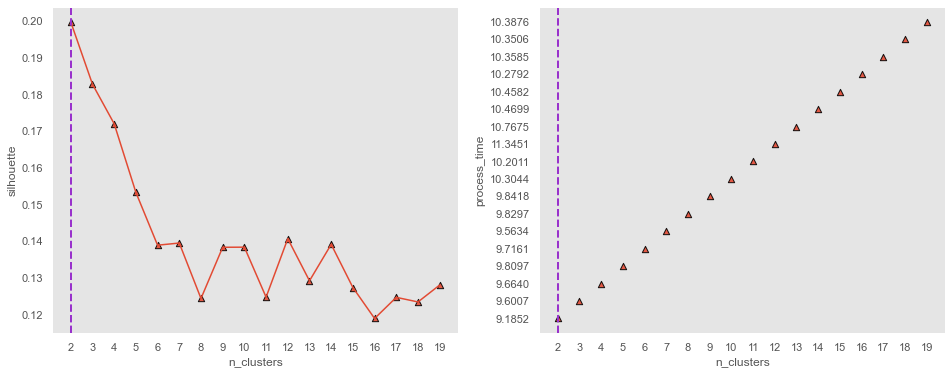

In [94]:
import math

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ...  use max silhouette score to mark optimal number of clusters
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

n_optimal_clusters = knn_tbl['silhouette'].argmax() + knn_tbl['n_clusters'].min()

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - plot metrics across models for comparison
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

plt.figure(figsize=(16, 6));

# ... silhouette values

plt.subplot(121);
plt.scatter(knn_tbl['n_clusters'],
            knn_tbl['silhouette'],
            s = 40,
            linewidths = 1.0,
            marker = '^',
            edgecolors = 'black',
            alpha = 0.90);

plt.plot(knn_tbl['n_clusters'],
         knn_tbl['silhouette'])

# ... vertical line at max silhouette value

plt.axvline(x = n_optimal_clusters, linewidth = 2, linestyle = 'dashed', color = 'darkorchid')

plt.xlabel('n_clusters'), plt.ylabel('silhouette');
xint = range(min(knn_tbl['n_clusters']), math.ceil(max(knn_tbl['n_clusters']))+1)
plt.xticks(xint)

plt.grid();

# ... process time

plt.subplot(122);
plt.scatter(knn_tbl['n_clusters'],
            knn_tbl['process_time'],
            s = 40,
            linewidths = 1.0,
            marker = '^',
            edgecolors = 'black',
            alpha = 0.90);

# ... vertical line at max silhouette value

plt.axvline(x = n_optimal_clusters, linewidth = 2, linestyle = 'dashed', color = 'darkorchid')

plt.xlabel('n_clusters'), plt.ylabel('process_time');
xint = range(min(knn_tbl['n_clusters']), math.ceil(max(knn_tbl['n_clusters']))+1)
plt.xticks(xint)

plt.grid();

plt.savefig("cluster_spctrl_number_of_clusters_eval.png")

plt.show();


Automatically created module for IPython interactive environment
For n_clusters = 2 The average silhouette_score is : 0.13954610705347265


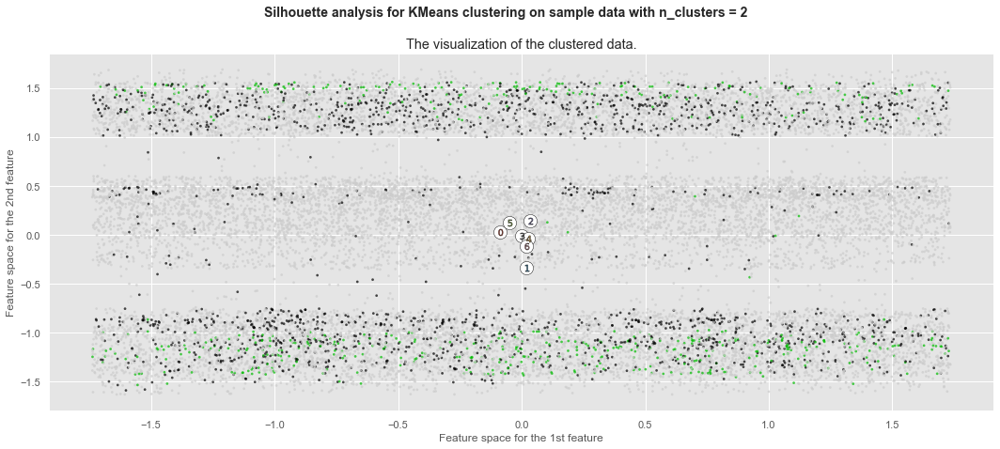

In [96]:

from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

print(__doc__)

dfb = bothclean.copy()
df3s = bothclean[['Wandering']]

X = kms_X.values[:,]
y = df3s[['Wandering']]
clusterer = kms4
random_state=123456789
silhouette_avg = kms4_sil

range_n_clusters = [2]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax2) = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    #ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    # ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a rsample_size=50andom generator
    # seed of 10 for reproducibility.
    clusterer = clusterer #KMeans(n_clusters=11, init='k-means++',random_state=1)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_avg
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)
    
    #ax1.set_title("The silhouette plot for the various clusters.")
    #ax1.set_xlabel("The silhouette coefficient values")
    #ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    #ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    #ax1.set_yticks([])  # Clear the yaxis labels / ticks
    #ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()


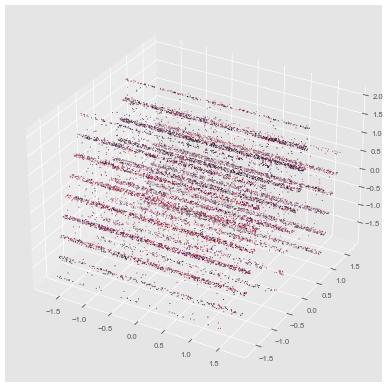

In [97]:
# Config 1
from mpl_toolkits import mplot3d
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,10)
X = kms_X.values[:,]
fig = plt.figure(dpi=50)
ax = plt.axes(projection='3d')

# Data for three-dimensional scattered points
zdata = X[:, 0].astype(float)
xdata = X[:, 1].astype(float)
ydata = X[:, 2].astype(float)
_ = ax.scatter3D(X[:, 0], X[:, 1], X[:, 2], c=kms_clusters, s=1)

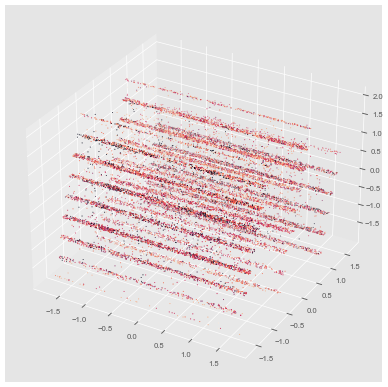

In [98]:

# Config 4
from mpl_toolkits import mplot3d
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,10)
X = kms_X.values[:,]
fig = plt.figure(dpi=50)
ax = plt.axes(projection='3d')

# Data for three-dimensional scattered points
zdata = X[:, 0].astype(float)
xdata = X[:, 1].astype(float)
ydata = X[:, 2].astype(float)
_ = ax.scatter3D(X[:, 0], X[:, 1], X[:, 2], c=kms_clusters4, s=1)